In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
from collections import Counter
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as mcolors
import seaborn as sns
from esda.moran import Moran
from libpysal.weights import DistanceBand
import geopandas as gpd
from scipy.spatial.distance import cdist

In [80]:
def create_binary_weights_matrix(coordinates, threshold):
    """
    Create a binary spatial weights matrix based on a distance threshold.
    """
    distance_matrix = cdist(coordinates, coordinates)
    weights_matrix = (distance_matrix <= threshold).astype(int)
    np.fill_diagonal(weights_matrix, 0)
    return weights_matrix

def morans_I_vectorized(values, spatial_weights):
    """
    Calculate Moran's I in a vectorized manner.
    """
    N = len(values)
    W = np.sum(spatial_weights)  # Total weight sum
    mean_value = np.mean(values)
    
    # Numerator
    diff = values - mean_value
    numerator = np.sum(spatial_weights * np.outer(diff, diff))
    
    # Denominator
    denominator = np.sum(diff ** 2)
    
    return (N / W) * (numerator / denominator)

def calculate_p_value(residuals, spatial_weights, observed_I, permutations=999):
    """
    Optimized permutation test for Moran's I.
    """
    N = len(residuals)
    mean_value = np.mean(residuals)
    diff = residuals - mean_value

    # Precompute denominator
    denominator = np.sum(diff ** 2)

    # Calculate randomized Moran's I for all permutations
    random_indices = [np.random.permutation(N) for _ in range(permutations)]
    random_I_values = [
        (len(residuals) / np.sum(spatial_weights)) *
        (np.sum(spatial_weights * np.outer(diff[perm], diff[perm])) / denominator)
        for perm in random_indices
    ]
    
    random_I_values = np.array(random_I_values)
    p_value = (np.sum(random_I_values >= observed_I) + 1) / (permutations + 1)
    
    return p_value

def morans_I(df, residuals, threshold=1000, crs_epsg=3395, permutations=999):
    """
    Calculate Moran's I with a p-value, including coordinate projection.
    Handles lat/lon data without an initial CRS.
    """
    # Step 1: Create GeoDataFrame from lat/lon without CRS
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df['Longitude_0'], df['Latitude_0']),
        crs=None  # Assume no CRS is defined
    )
    
    # Step 2: Assign EPSG:4326 as the CRS
    gdf.crs = "EPSG:4326"  # Tell GeoPandas that the coordinates are lat/lon

    # Step 3: Project to the desired CRS (e.g., EPSG:3395)
    gdf = gdf.to_crs(epsg=crs_epsg)

    # Step 4: Extract projected coordinates in meters
    coordinates = np.array([(point.x, point.y) for point in gdf.geometry])
    
    # Step 5: Create spatial weights matrix
    weights_matrix = create_binary_weights_matrix(coordinates, threshold)
    
    # Step 6: Calculate observed Moran's I
    observed_I = morans_I_vectorized(residuals, weights_matrix)
    
    # Step 7: Calculate p-value using optimized permutation test
    p_value = calculate_p_value(residuals, weights_matrix, observed_I, permutations)
    
    return observed_I, p_value

In [81]:
df = pd.read_csv(r"C:\Users\vwgei\Documents\PVOCAL\data\V4\old\df_preprocessed_backup.csv")


In [82]:
df['Datetime'] = pd.to_datetime(df['Datetime'], format='%m/%d/%Y %H:%M')

In [83]:
CO = df['CO']

In [84]:
df = df.sort_values(by='Datetime')

In [85]:
df['time_index'] = range(len(df))

In [86]:
for c in df.columns:
    print(c)

iindex
LAT
LON
ALT
Datetime
Datetime_old
CH4
CO2
CO
O3
Ethane
DMS
CH3Br
Year
Month
Day
Hour
domain_indicator
Pressure_-24
Potential_Temperature_-24
Temperature_-24
Rainfall_-24
Mixing_Depth_-24
Relative_Humidity_-24
Specific_Humidity_-24
Mixing_Ratio_-24
Terrain_Altitude_-24
Solar_Radiation_-24
geometry_-24
DateTime_-24
Temperature_C_-24
Distance_ptp_-24
Cumulative_Dist_-24
Dist_from_origin_-24
bearings_from_origin_-24
bearings_ptp_-24
Moisture_Flux_-24
Pressure_-23
Potential_Temperature_-23
Temperature_-23
Rainfall_-23
Mixing_Depth_-23
Relative_Humidity_-23
Specific_Humidity_-23
Mixing_Ratio_-23
Terrain_Altitude_-23
Solar_Radiation_-23
geometry_-23
DateTime_-23
Temperature_C_-23
Distance_ptp_-23
Cumulative_Dist_-23
Dist_from_origin_-23
bearings_from_origin_-23
bearings_ptp_-23
Moisture_Flux_-23
Pressure_-22
Potential_Temperature_-22
Temperature_-22
Rainfall_-22
Mixing_Depth_-22
Relative_Humidity_-22
Specific_Humidity_-22
Mixing_Ratio_-22
Terrain_Altitude_-22
Solar_Radiation_-22
geomet

In [87]:
# with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_Ethane\data\Ethane_global_X_test.pkl", 'rb') as file:
#     ethane_test = pickle.load(file)

# ethane_test['iindex'] = ethane_test.index

# merged = ethane_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')


# # Calculate Moran's I and p-value
# I, p_value = morans_I(merged, ethane_residual_test, threshold=100000, crs_epsg=3395, permutations=10)
# print(f"Observed Moran's I: {round(I, 4)}")
# print(f"P-value: {round(p_value, 4)}")

In [88]:
df['sum_moisture_flux'].max()

6955.0133124

In [89]:
# input_features = [
#     'mean_distance_to_cluster_centroids', 'mean_distance_to_antimeridian', 'mean_distance_to_t1000_cities',
#     'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
#     'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
#     'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
# ]

In [90]:
os.chdir(r"C:\Users\vwgei\Documents\PVOCAL\plots\standalone\input_vars")

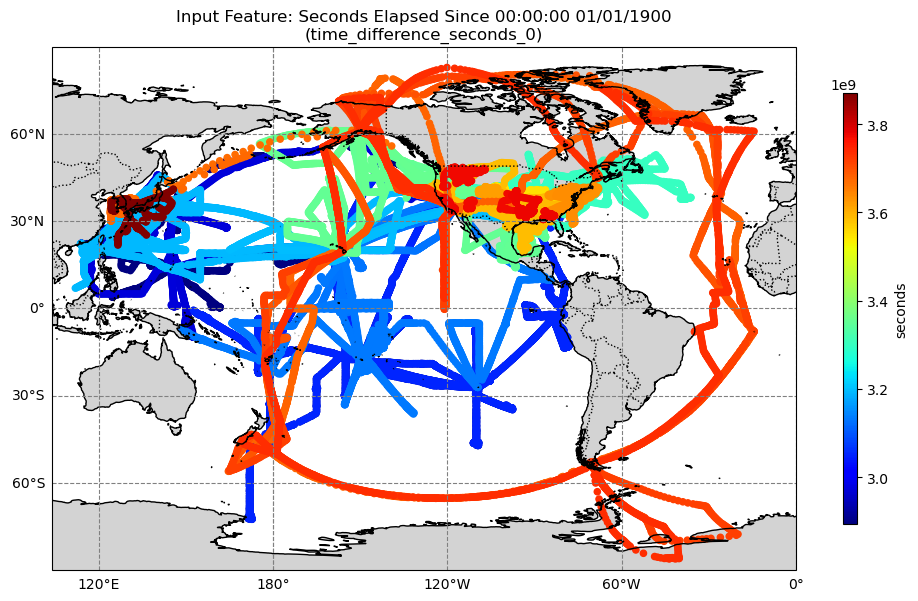

In [91]:
var = 'time_difference_seconds_0'

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='lightgray')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# Set up the color normalization to a logarithmic scale
# norm = mcolors.LogNorm(vmin=np.nanmin(df[var].values), vmax=np.nanmax(df[var].values))
# norm = mcolors.LogNorm(vmin=1, vmax=np.nanmax(df[var].values))
# norm = mcolors.LogNorm(vmin=1, vmax=6955)


# Plot the data with the log-normalized color scale
sc = ax.scatter(
    df['Longitude_0'].values, 
    df['Latitude_0'].values, 
    c=df[var].values,  # Use numeric values for consistent coloring
    cmap='jet', 
    s=20, 
    transform=ccrs.PlateCarree(),
    # norm=norm  # Apply the logarithmic normalization
    # vmin=0,
    # vmax=3000
)

# Update the colorbar to match the log scale
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend="max"
cbar.set_label(f'seconds')

# Title and labels
ax.set_title(f"Input Feature: Seconds Elapsed Since 00:00:00 01/01/1900\n(time_difference_seconds_0)")

# Save and display
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\standalone\input_vars\{var}.png")
plt.show()

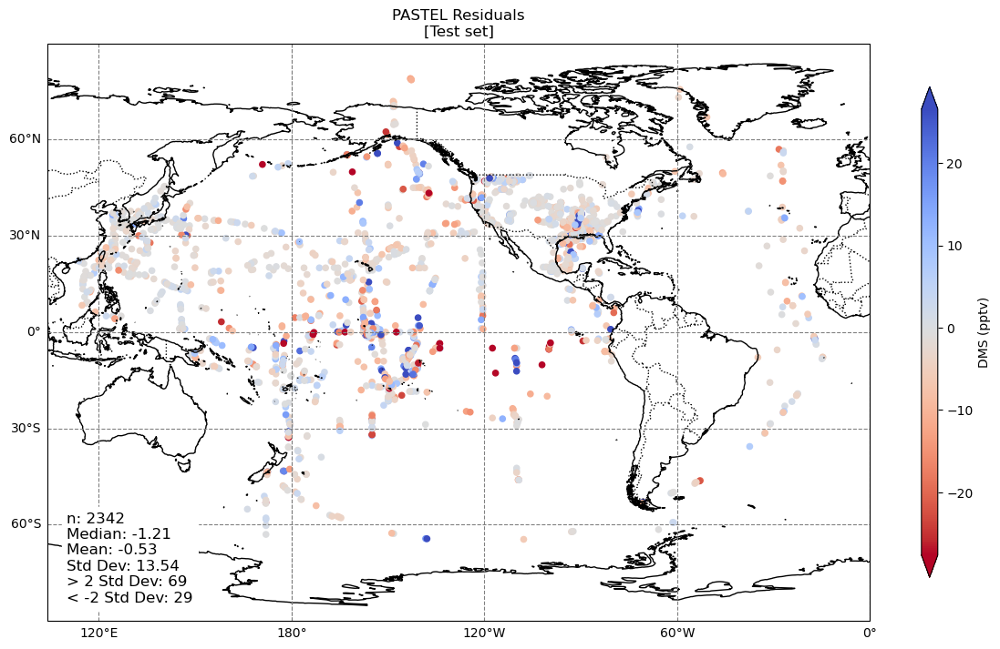

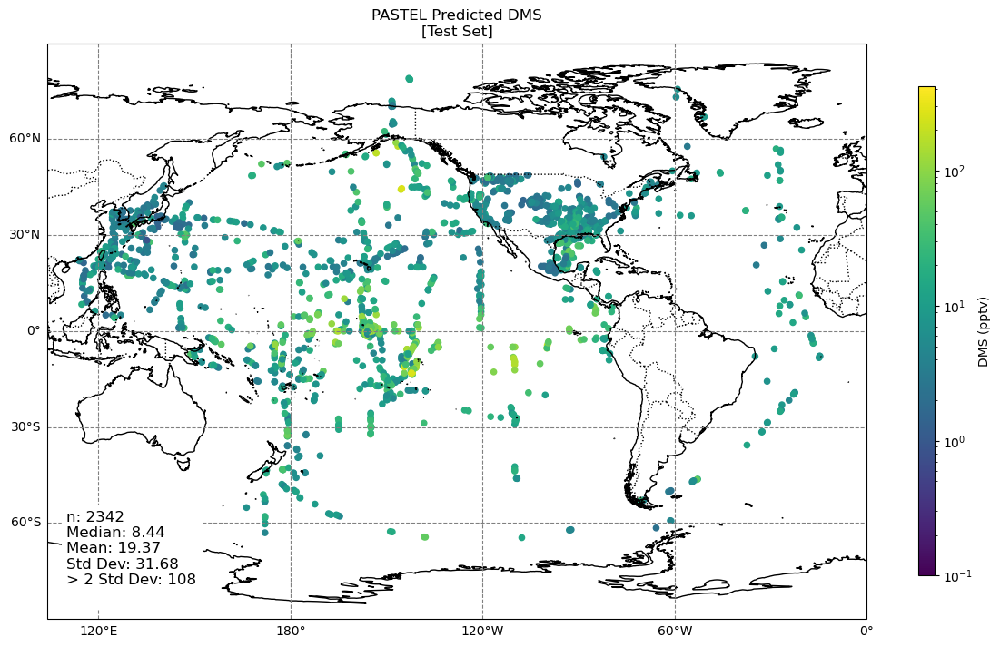

In [92]:
# Open the file in binary read mode and load the object
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_DMS\data\DMS_global_X_train.pkl", 'rb') as file:
    dms_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_DMS\data\DMS_global_X_test.pkl", 'rb') as file:
    dms_test = pickle.load(file)

dms_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS\DMS_PASTEL_combined_residuals_train.npy")
dms_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS\DMS_PASTEL_combined_residuals_test.npy")
dms_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS\DMS_PASTEL_combined_pred_train.npy")
dms_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS\DMS_PASTEL_combined_pred_test.npy")

dms_test['iindex'] = dms_test.index

merged_dms = dms_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')


# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = dms_residual_test #np.concatenate([dms_residual_train, dms_residual_test]) 

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_dms['Longitude_0'].values, 
    merged_dms['Latitude_0'].values, 
    c=dms_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'DMS (pptv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\DMS\DMS_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = dms_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)

# Set up the color normalization (using linear scale)
norm = mcolors.LogNorm(vmin=0.1, vmax=420)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the ata for the test set
sc1 = ax.scatter(
    merged_dms['Longitude_0'].values, 
    merged_dms['Latitude_0'].values, 
    c=dms_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'DMS (pptv)')

# Title and labels
ax.set_title(f"PASTEL Predicted DMS\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\DMS\DMS_combined_pred_test.png")
plt.tight_layout()
plt.show()

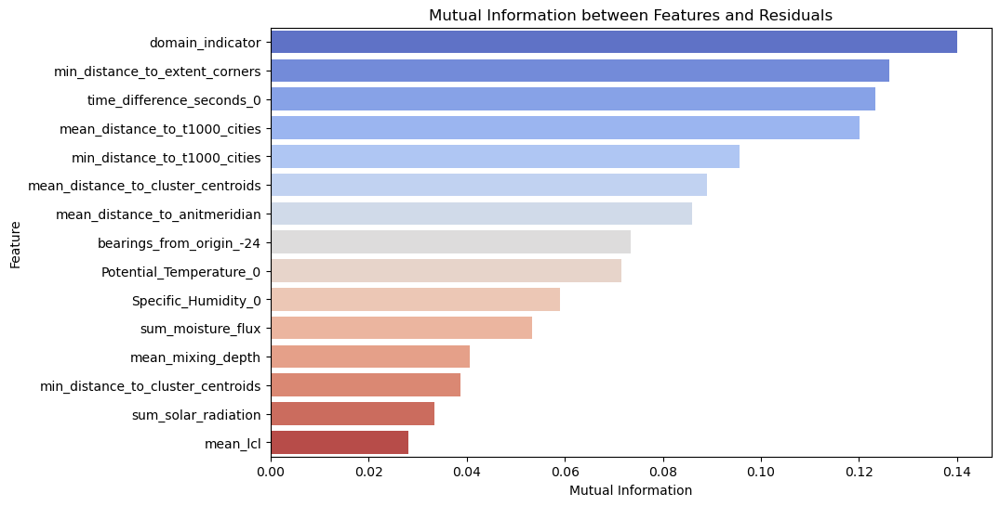

                               Feature  Mutual Information
13                    domain_indicator            0.140044
5       min_distance_to_extent_corners            0.126132
14           time_difference_seconds_0            0.123320
2        mean_distance_to_t1000_cities            0.120187
3         min_distance_to_t1000_cities            0.095684
0   mean_distance_to_cluster_centroids            0.088926
1        mean_distance_to_anitmeridian            0.086007
9             bearings_from_origin_-24            0.073371
7              Potential_Temperature_0            0.071495
6                  Specific_Humidity_0            0.058959
10                   sum_moisture_flux            0.053424
11                   mean_mixing_depth            0.040716
4    min_distance_to_cluster_centroids            0.038786
12                 sum_solar_radiation            0.033324
8                             mean_lcl            0.028012
residuals                             1.000000
mean_dist

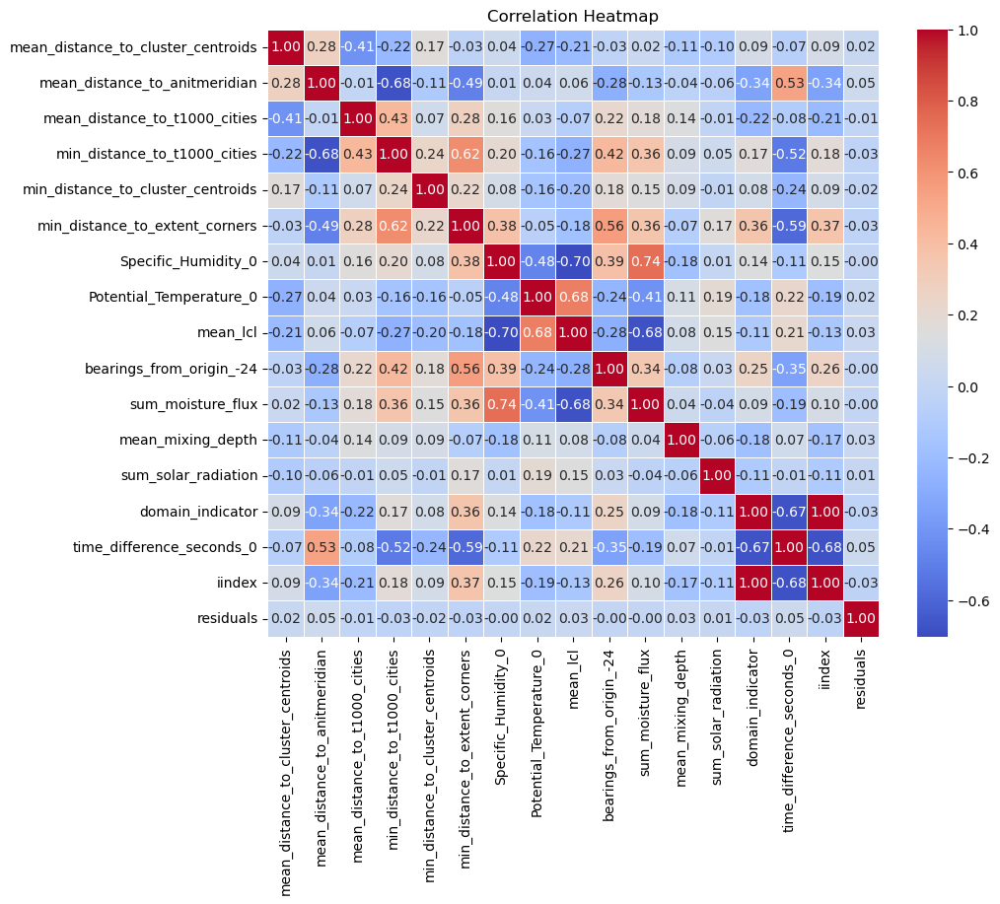

In [93]:
from sklearn.feature_selection import mutual_info_regression
dms_test['residuals'] = dms_residual_test
dms_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(dms_test.drop('residuals', axis=1), dms_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': dms_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

mutual_info_df.drop(15, inplace=True)

# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = dms_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Average RF testing Morans I: -0.11115384615384614


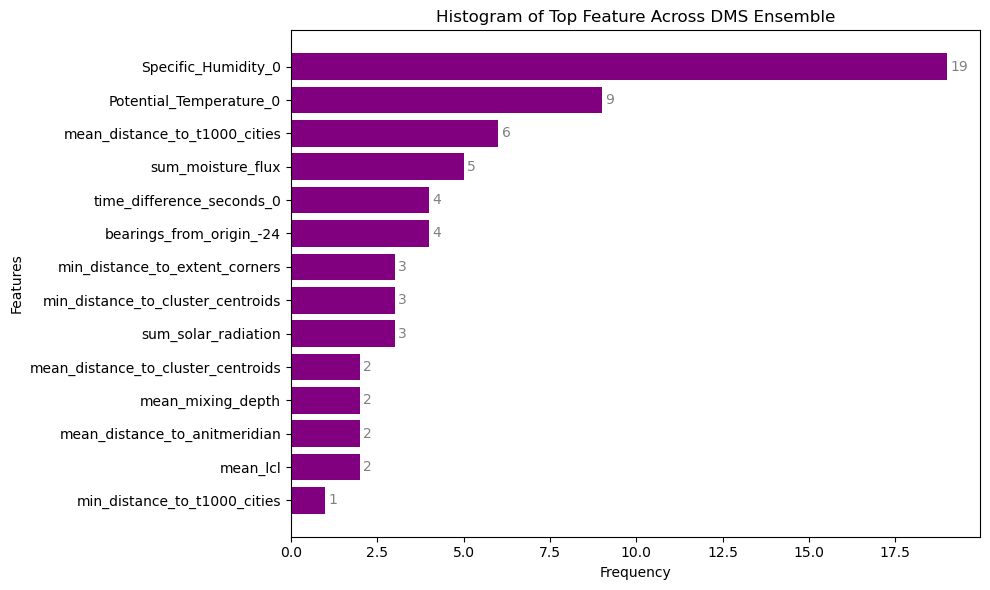

In [94]:
ats = "DMS"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='purple')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

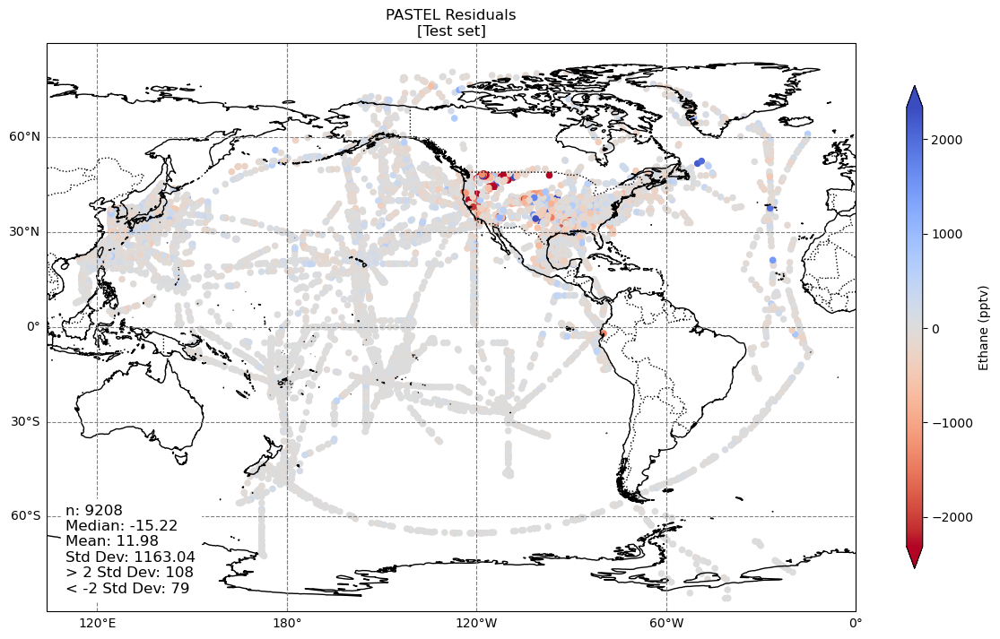

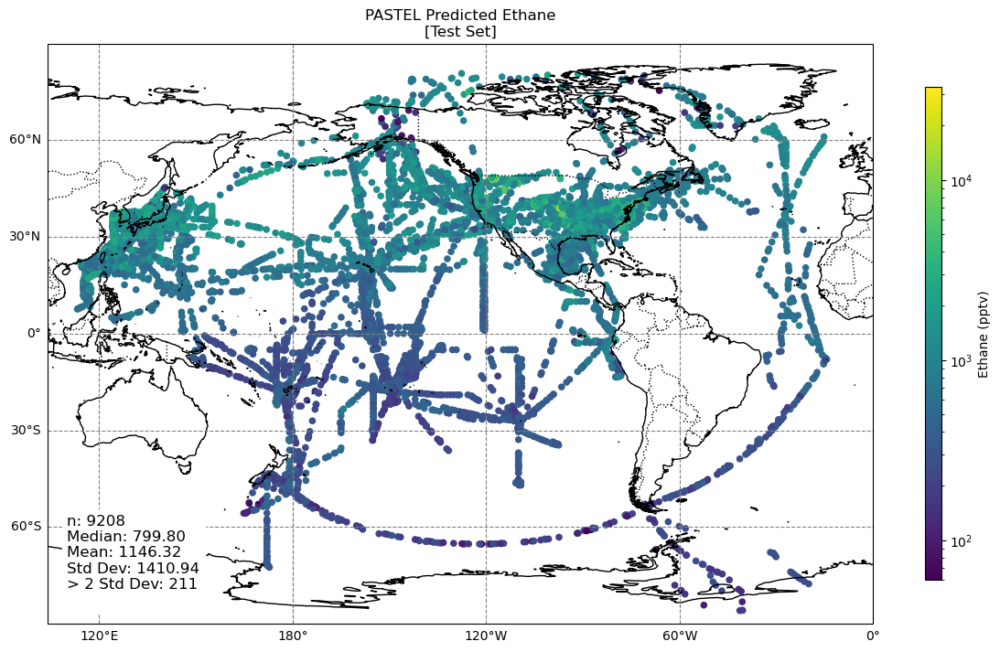

In [95]:
# Open the file in binary read mode and load the object
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_Ethane\data\Ethane_global_X_train.pkl", 'rb') as file:
    ethane_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_Ethane\data\Ethane_global_X_test.pkl", 'rb') as file:
    ethane_test = pickle.load(file)

ethane_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_residuals_train.npy")
ethane_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_residuals_test.npy")
ethane_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_pred_train.npy")
ethane_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_pred_test.npy")

ethane_test['iindex'] = ethane_test.index

merged_ethane = ethane_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')

# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = ethane_residual_test #np.concatenate([dms_residual_train, dms_residual_test])

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ethane['Longitude_0'].values, 
    merged_ethane['Latitude_0'].values, 
    c=ethane_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'Ethane (pptv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\Ethane\Ethane_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = ethane_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)


norm = mcolors.LogNorm(vmin=60, vmax=np.max(ethane_pred_test)) #np.min(ethane_pred_test)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ethane['Longitude_0'].values, 
    merged_ethane['Latitude_0'].values, 
    c=ethane_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'Ethane (pptv)')

# Title and labels
ax.set_title(f"PASTEL Predicted Ethane\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\Ethane\Ethane_combined_pred_test.png")
plt.tight_layout()
plt.show()

In [96]:
ethane_snr = np.var(ethane_pred_test) / np.var(ethane_residual_test)
ethane_snr

1.4717329919717645

In [97]:
print(len(ethane_train))
print(len(ethane_test))

36830
9208


In [98]:
ethane_test['pred'] = ethane_pred_test

In [99]:
# # Assuming ethane_test is your dataset
# # Split the dataset into two hemispheres
# north_hemisphere = merged_ethane[merged_ethane['Latitude_0'] > 0]
# south_hemisphere = merged_ethane[merged_ethane['Latitude_0'] < 0]

# # Calculate the average residuals for each hemisphere
# average_residual_north = north_hemisphere['pred'].mean()
# average_residual_south = south_hemisphere['pred'].mean()

# # Output the results
# print(f"Average ethane in the Northern Hemisphere: {average_residual_north}")
# print(f"Average ethane in the Southern Hemisphere: {average_residual_south}")

In [100]:
# north_hemisphere = df[df['Latitude_0'] > 0]
# south_hemisphere = df[df['Latitude_0'] < 0]

# # Calculate the average residuals for each hemisphere
# average_residual_north = north_hemisphere['Ethane'].mean()
# average_residual_south = south_hemisphere['Ethane'].mean()

# # Output the results
# print(f"Average ethane in the Northern Hemisphere: {average_residual_north}")
# print(f"Average ethane in the Southern Hemisphere: {average_residual_south}")

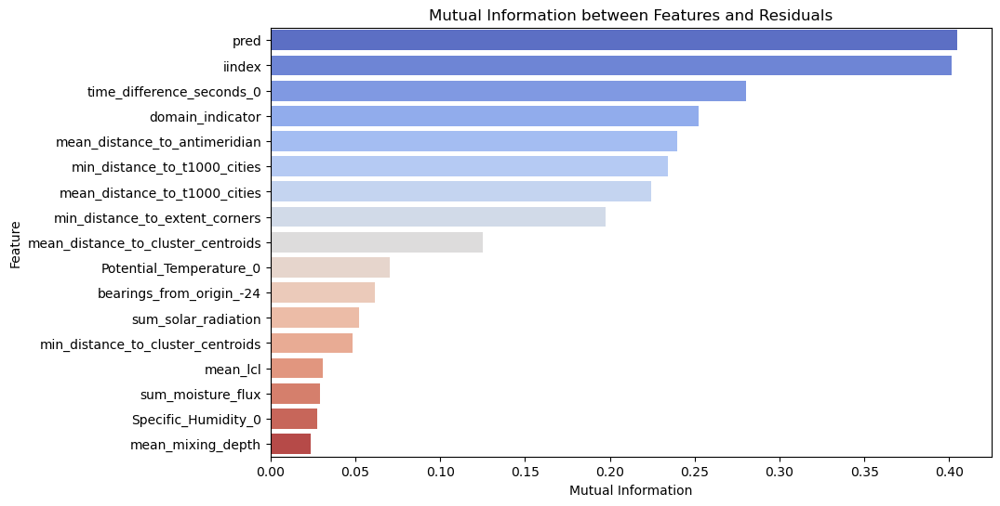

                               Feature  Mutual Information
16                                pred            0.404723
15                              iindex            0.401409
14           time_difference_seconds_0            0.280082
13                    domain_indicator            0.252265
1        mean_distance_to_antimeridian            0.239917
3         min_distance_to_t1000_cities            0.234205
2        mean_distance_to_t1000_cities            0.224146
5       min_distance_to_extent_corners            0.197374
0   mean_distance_to_cluster_centroids            0.125087
7              Potential_Temperature_0            0.070121
9             bearings_from_origin_-24            0.061525
12                 sum_solar_radiation            0.052156
4    min_distance_to_cluster_centroids            0.048423
8                             mean_lcl            0.030901
10                   sum_moisture_flux            0.028861
6                  Specific_Humidity_0            0.0277

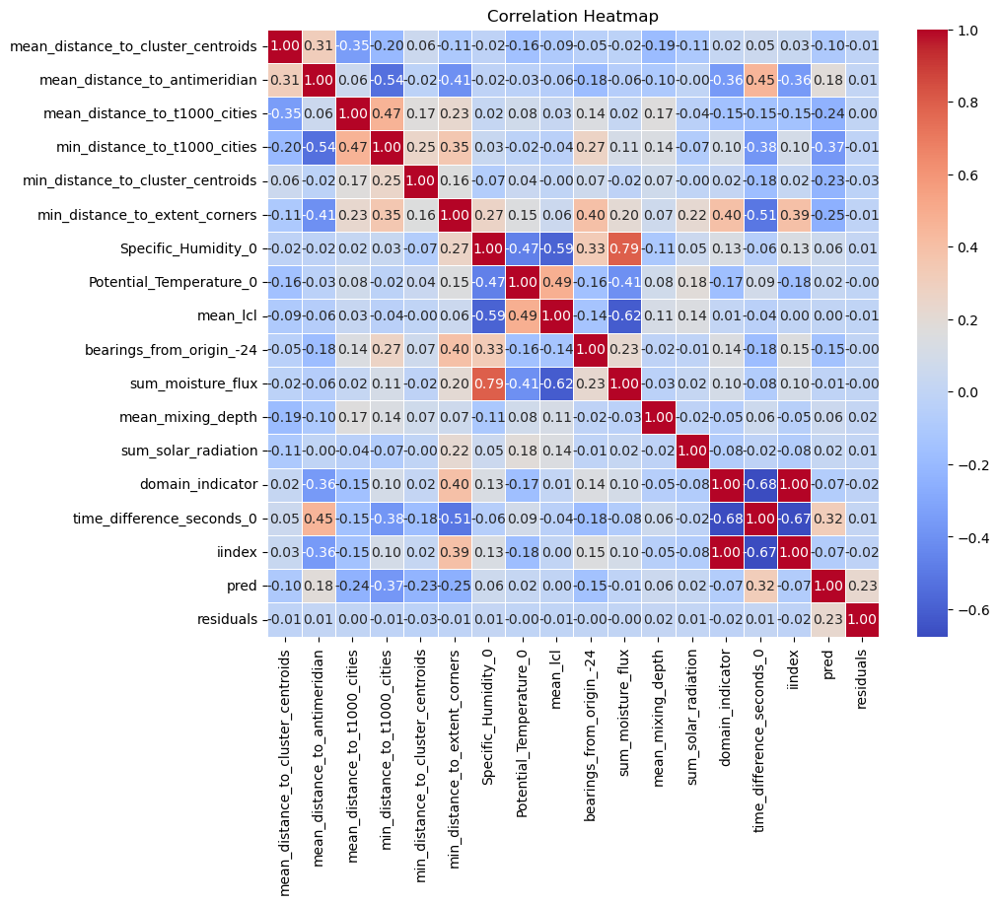

In [101]:
from sklearn.feature_selection import mutual_info_regression
ethane_test['residuals'] = ethane_residual_test
ethane_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(ethane_test.drop('residuals', axis=1), ethane_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': ethane_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# mutual_info_df.drop(15, inplace=True)
# mutual_info_df.drop(16, inplace=True)
# mutual_info_df.drop(17, inplace=True)


# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_DMS", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = ethane_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [102]:
# # Assuming ethane_test is your dataset
# # Split the dataset into two hemispheres
# north_hemisphere = merged_ethane[merged_ethane['Latitude_0'] > 0]
# south_hemisphere = merged_ethane[merged_ethane['Latitude_0'] < 0]

# # Calculate the average residuals for each hemisphere
# average_residual_north = north_hemisphere['residuals'].mean()
# average_residual_south = south_hemisphere['residuals'].mean()

# # Output the results
# print(f"Average residual in the Northern Hemisphere: {average_residual_north}")
# print(f"Average residual in the Southern Hemisphere: {average_residual_south}")

Average RF testing Morans I: 0.018492307692307693


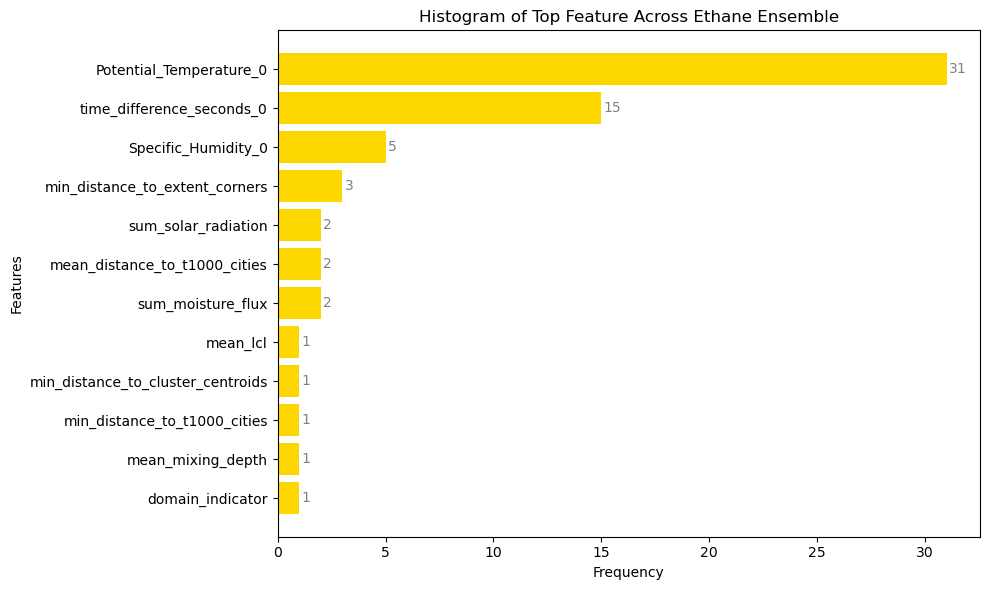

In [103]:
ats = "Ethane"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='gold')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

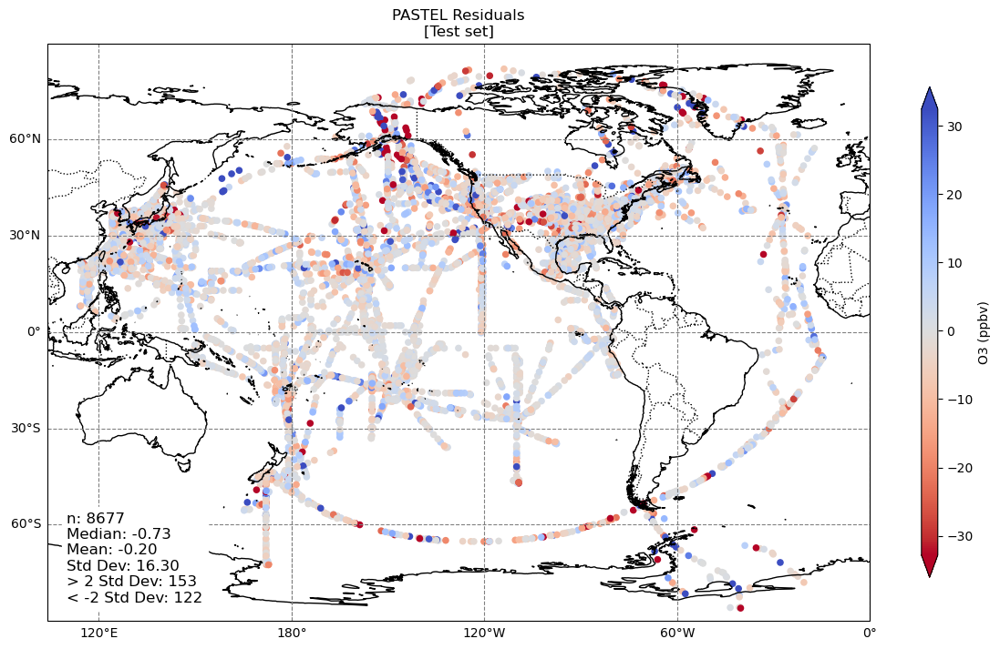

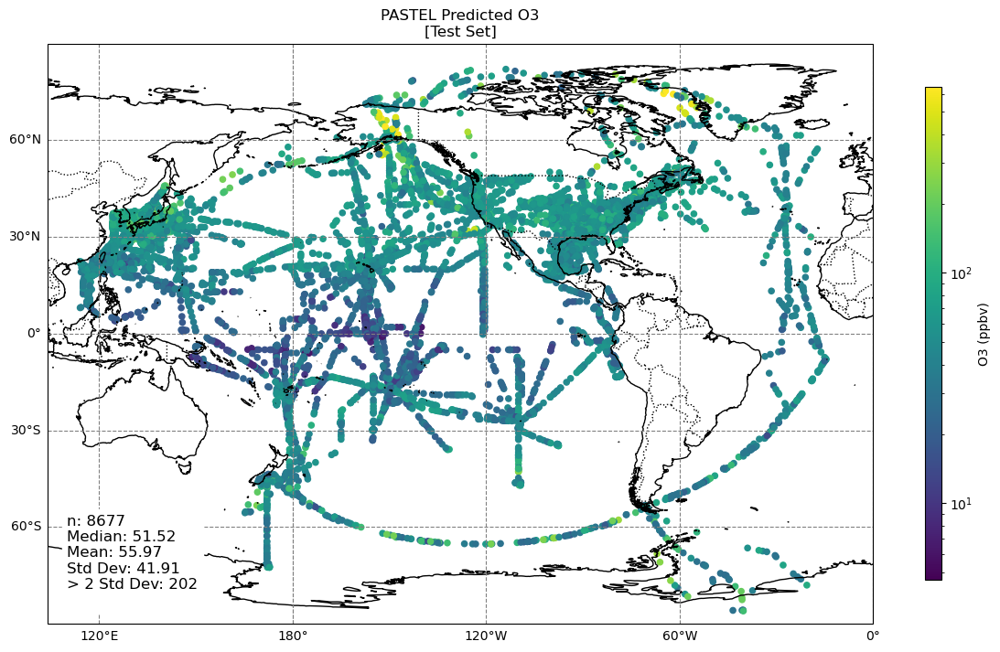

In [104]:
# Open the file in binary read mode and load the object
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_O3\data\O3_global_X_train.pkl", 'rb') as file:
    o3_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_O3\data\O3_global_X_test.pkl", 'rb') as file:
    o3_test = pickle.load(file)

o3_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_O3\O3_PASTEL_combined_residuals_train.npy")
o3_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_O3\O3_PASTEL_combined_residuals_test.npy")
o3_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_O3\O3_PASTEL_combined_pred_train.npy")
o3_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_O3\O3_PASTEL_combined_pred_test.npy")

o3_test['iindex'] = o3_test.index

merged_o3 = o3_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')

# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = o3_residual_test #np.concatenate([dms_residual_train, dms_residual_test])

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_o3['Longitude_0'].values, 
    merged_o3['Latitude_0'].values, 
    c=o3_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'O3 (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\O3\O3_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = o3_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)


norm = mcolors.LogNorm(vmin=np.min(o3_pred_test), vmax=np.max(o3_pred_test))

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_o3['Longitude_0'].values, 
    merged_o3['Latitude_0'].values, 
    c=o3_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'O3 (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Predicted O3\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\O3\O3_combined_pred_test.png")
plt.tight_layout()
plt.show()

In [105]:
o3_snr = np.var(o3_pred_test) / np.var(o3_residual_test)
o3_snr

6.608391958370949

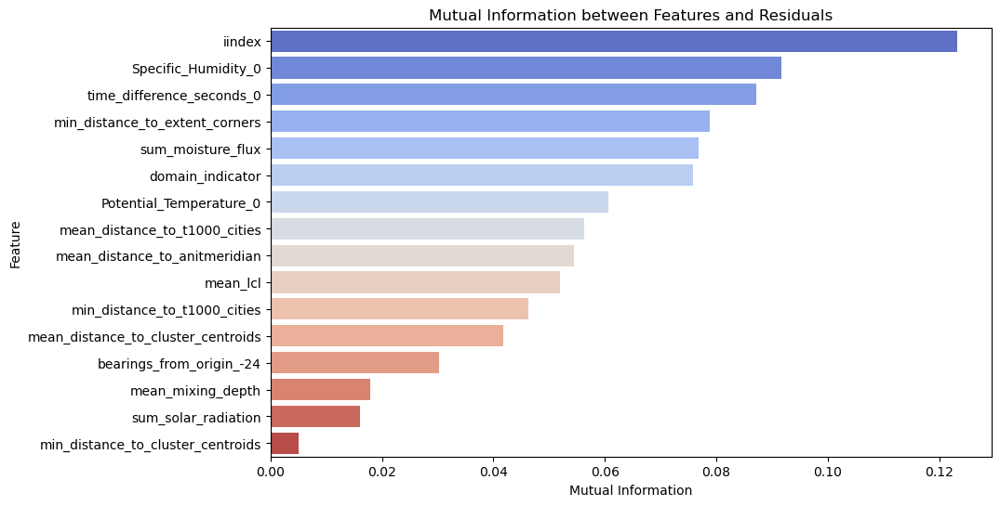

                               Feature  Mutual Information
15                              iindex            0.123231
6                  Specific_Humidity_0            0.091602
14           time_difference_seconds_0            0.087186
5       min_distance_to_extent_corners            0.078841
10                   sum_moisture_flux            0.076849
13                    domain_indicator            0.075814
7              Potential_Temperature_0            0.060647
2        mean_distance_to_t1000_cities            0.056302
1        mean_distance_to_anitmeridian            0.054379
8                             mean_lcl            0.051931
3         min_distance_to_t1000_cities            0.046192
0   mean_distance_to_cluster_centroids            0.041741
9             bearings_from_origin_-24            0.030304
11                   mean_mixing_depth            0.017893
12                 sum_solar_radiation            0.016013
4    min_distance_to_cluster_centroids            0.0050

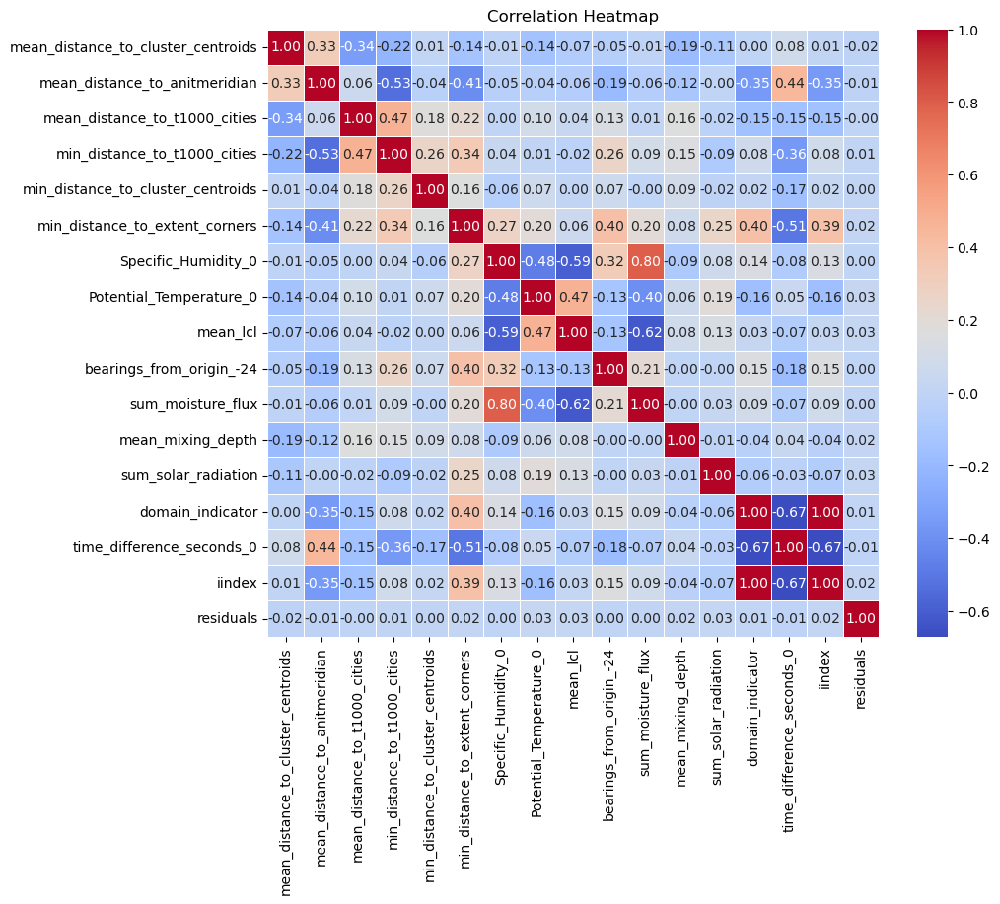

In [106]:
from sklearn.feature_selection import mutual_info_regression
o3_test['residuals'] = o3_residual_test
o3_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(o3_test.drop('residuals', axis=1), o3_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': o3_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_O3", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = o3_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Average RF testing Morans I: 0.012307692307692308


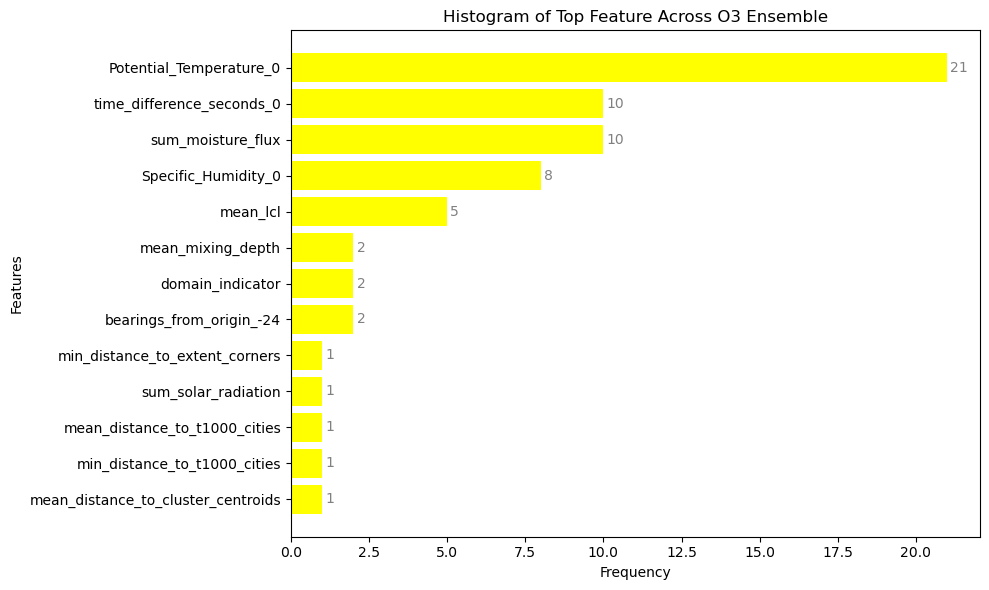

In [107]:
ats = "O3"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='yellow')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

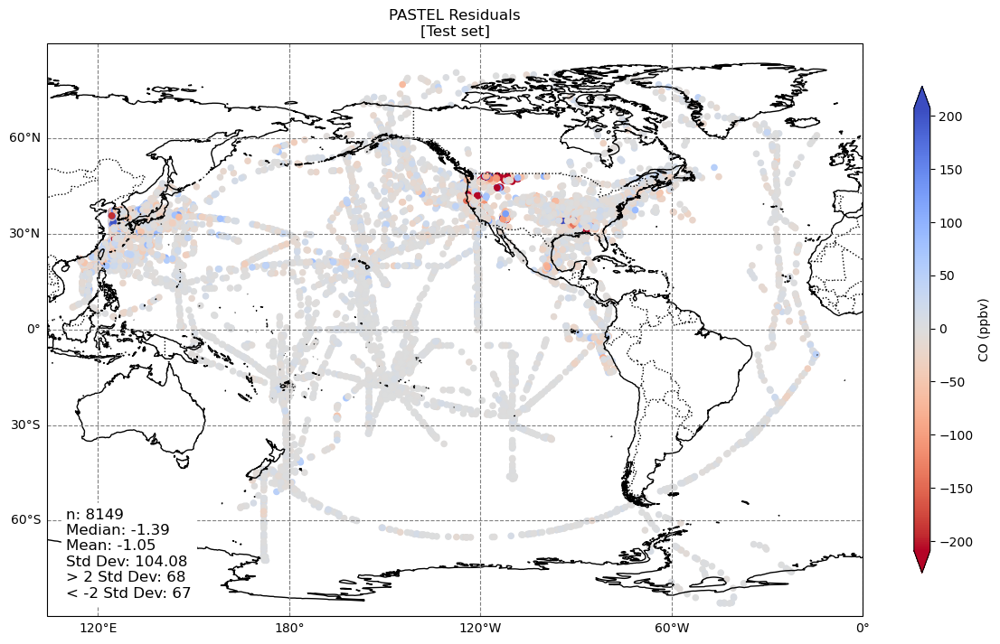

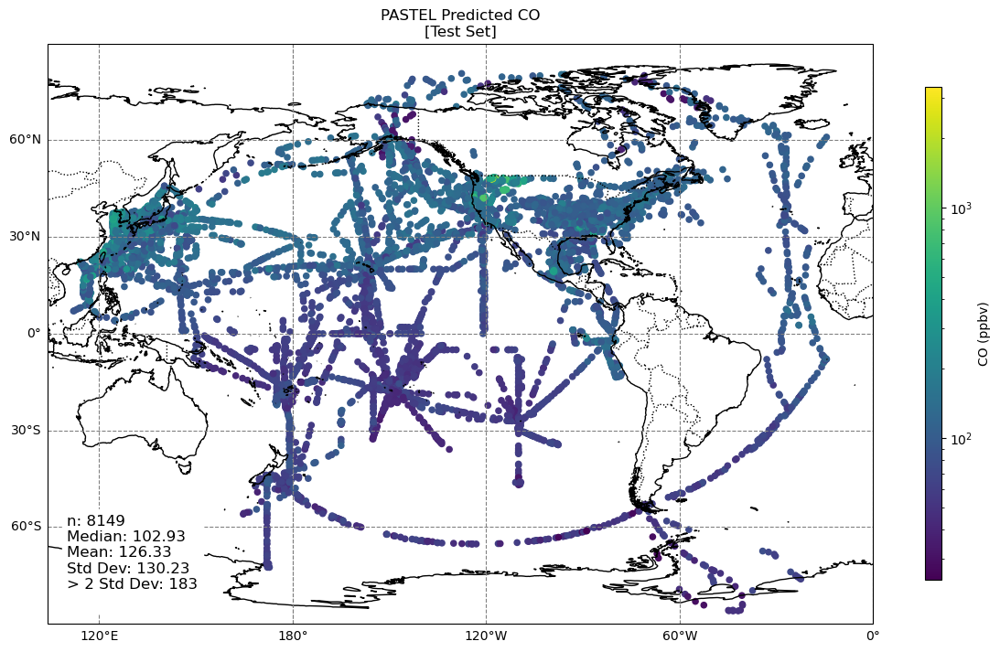

In [108]:
# Open the file in binary read mode and load the object
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_CO\data\CO_global_X_train.pkl", 'rb') as file:
    co_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_CO\data\CO_global_X_test.pkl", 'rb') as file:
    co_test = pickle.load(file)

co_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CO\CO_PASTEL_combined_residuals_train.npy")
co_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CO\CO_PASTEL_combined_residuals_test.npy")
co_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CO\CO_PASTEL_combined_pred_train.npy")
co_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CO\CO_PASTEL_combined_pred_test.npy")

co_test['iindex'] = co_test.index

merged_co = co_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')

# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = co_residual_test #np.concatenate([dms_residual_train, dms_residual_test])

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_co['Longitude_0'].values, 
    merged_co['Latitude_0'].values, 
    c=co_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'CO (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CO\CO_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = co_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)


norm = mcolors.LogNorm(vmin=np.min(co_pred_test), vmax=np.max(co_pred_test))

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_co['Longitude_0'].values, 
    merged_co['Latitude_0'].values, 
    c=co_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'CO (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Predicted CO\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CO\CO_combined_pred_test.png")
plt.tight_layout()
plt.show()

In [109]:
co_snr = np.var(co_pred_test) / np.var(co_residual_test)
co_snr

1.5655448448517328

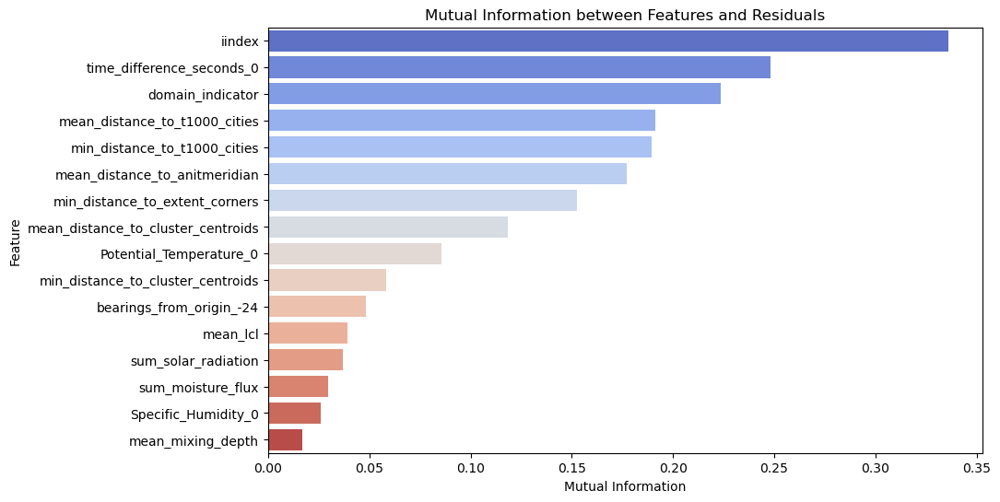

                               Feature  Mutual Information
15                              iindex            0.336052
14           time_difference_seconds_0            0.248157
13                    domain_indicator            0.223721
2        mean_distance_to_t1000_cities            0.191183
3         min_distance_to_t1000_cities            0.189374
1        mean_distance_to_anitmeridian            0.177218
5       min_distance_to_extent_corners            0.152730
0   mean_distance_to_cluster_centroids            0.118555
7              Potential_Temperature_0            0.085745
4    min_distance_to_cluster_centroids            0.058462
9             bearings_from_origin_-24            0.048409
8                             mean_lcl            0.039055
12                 sum_solar_radiation            0.037028
10                   sum_moisture_flux            0.029547
6                  Specific_Humidity_0            0.025941
11                   mean_mixing_depth            0.0169

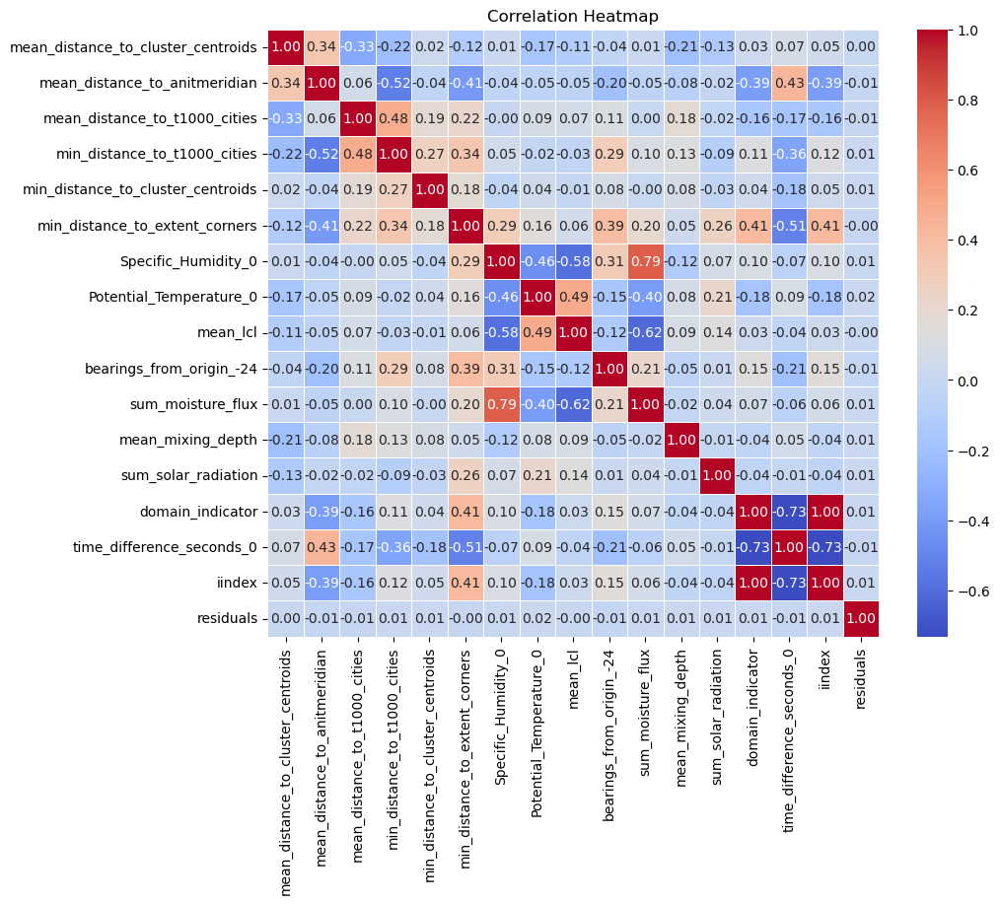

In [110]:
from sklearn.feature_selection import mutual_info_regression
co_test['residuals'] = co_residual_test
co_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(co_test.drop('residuals', axis=1), co_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': co_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CO", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = co_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Average RF testing Morans I: 0.008692307692307695


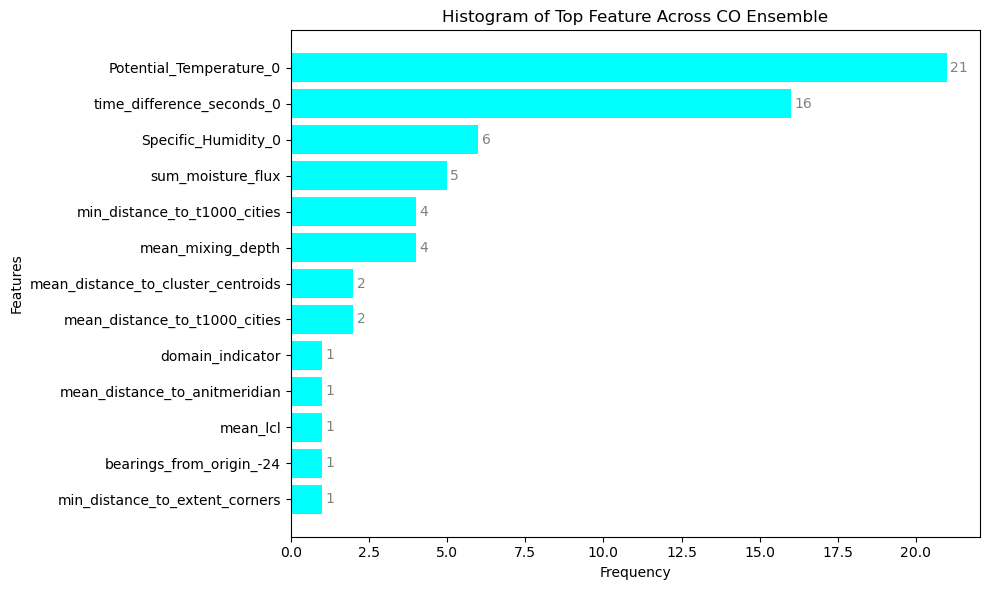

In [111]:
ats = "CO"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='cyan')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

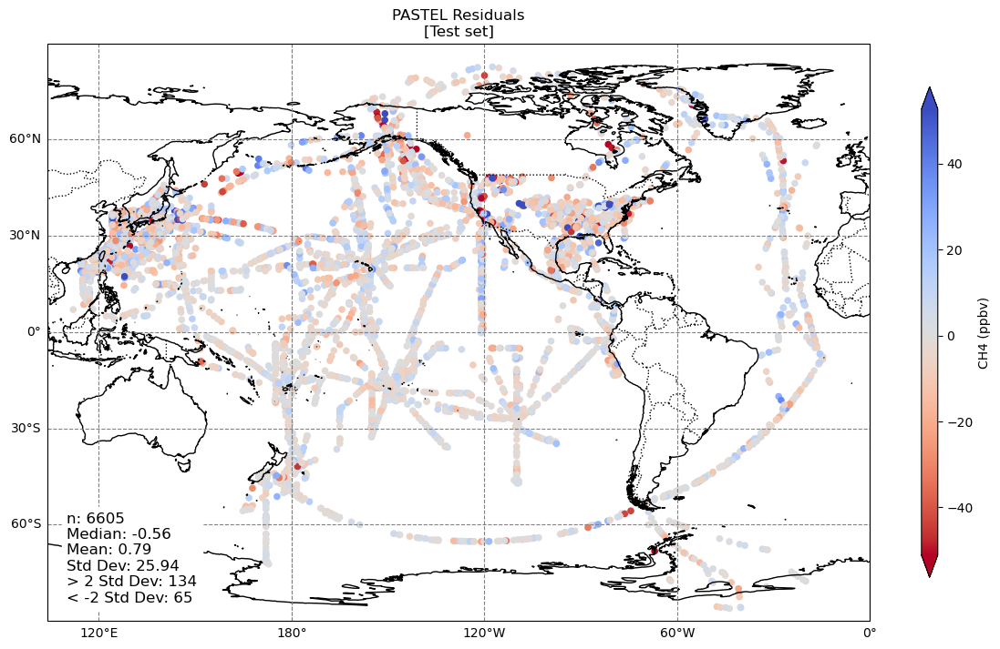

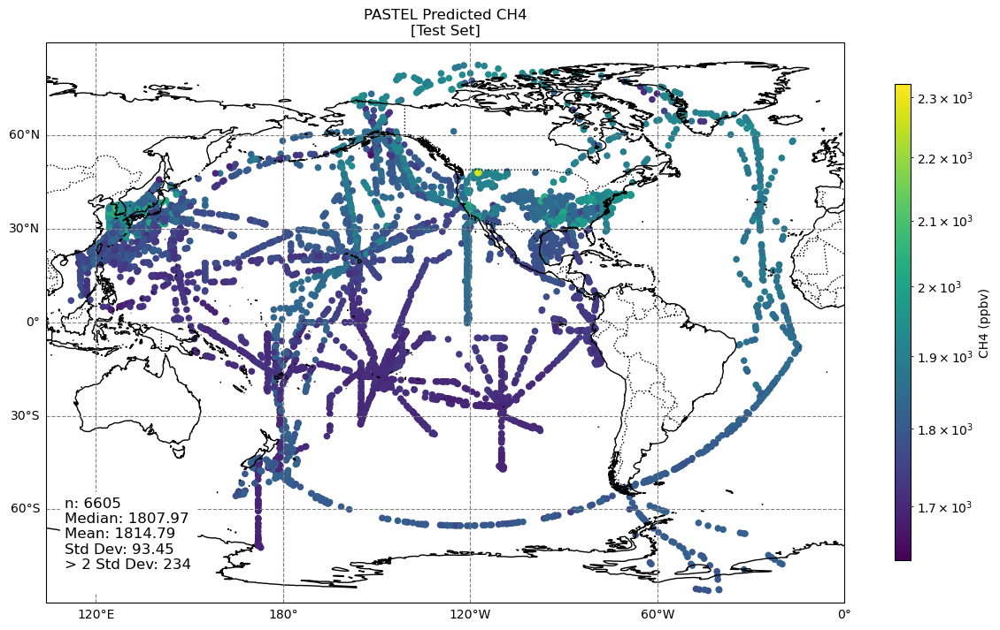

In [112]:
# # Open the file in binary read mode and load the object
# with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_CH4\data\CH4_global_X_train.pkl", 'rb') as file:
#     ch4_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_models\V4_CH4\data\CH4_global_X_test.pkl", 'rb') as file:
    ch4_test = pickle.load(file)

# ch4_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4\CH4_PASTEL_combined_residuals_train.npy")
ch4_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4\CH4_PASTEL_combined_residuals_test.npy")
# ch4_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4\CH4_PASTEL_combined_pred_train.npy")
ch4_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4\CH4_PASTEL_combined_pred_test.npy")

ch4_test['iindex'] = ch4_test.index

merged_ch4 = ch4_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')

# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = ch4_residual_test #np.concatenate([dms_residual_train, dms_residual_test])

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ch4['Longitude_0'].values, 
    merged_ch4['Latitude_0'].values, 
    c=ch4_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'CH4 (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CH4\CH4_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = ch4_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)


norm = mcolors.LogNorm(vmin=np.min(ch4_pred_test), vmax=np.max(ch4_pred_test))


# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ch4['Longitude_0'].values, 
    merged_ch4['Latitude_0'].values, 
    c=ch4_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'CH4 (ppbv)')

# Title and labels
ax.set_title(f"PASTEL Predicted CH4\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CH4\CH4_combined_pred_test.png")
plt.tight_layout()
plt.show()

In [113]:
ch4_snr = np.var(ch4_pred_test) / np.var(ch4_residual_test)
ch4_snr

12.984105224438364

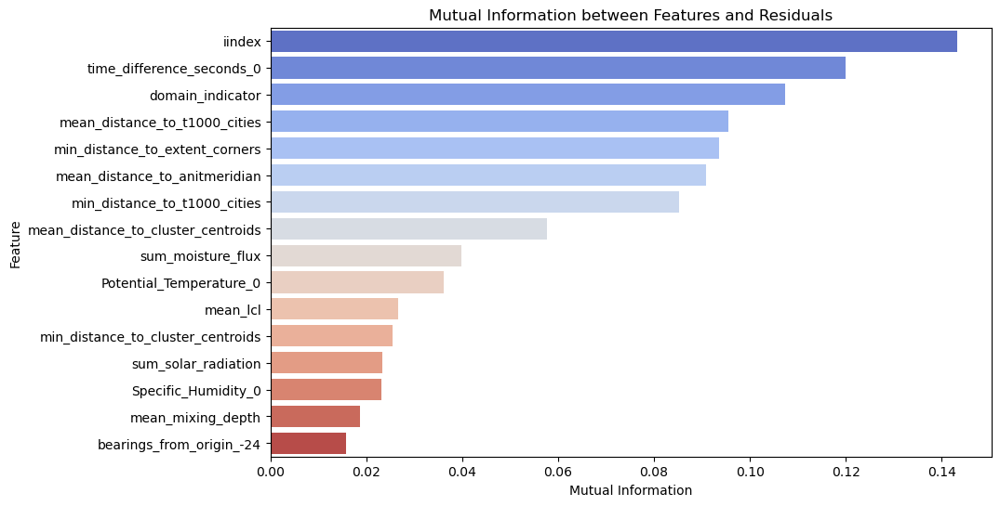

                               Feature  Mutual Information
15                              iindex            0.143248
14           time_difference_seconds_0            0.119887
13                    domain_indicator            0.107387
2        mean_distance_to_t1000_cities            0.095574
5       min_distance_to_extent_corners            0.093510
1        mean_distance_to_anitmeridian            0.090784
3         min_distance_to_t1000_cities            0.085232
0   mean_distance_to_cluster_centroids            0.057637
10                   sum_moisture_flux            0.039748
7              Potential_Temperature_0            0.036112
8                             mean_lcl            0.026616
4    min_distance_to_cluster_centroids            0.025465
12                 sum_solar_radiation            0.023259
6                  Specific_Humidity_0            0.023091
11                   mean_mixing_depth            0.018649
9             bearings_from_origin_-24            0.0156

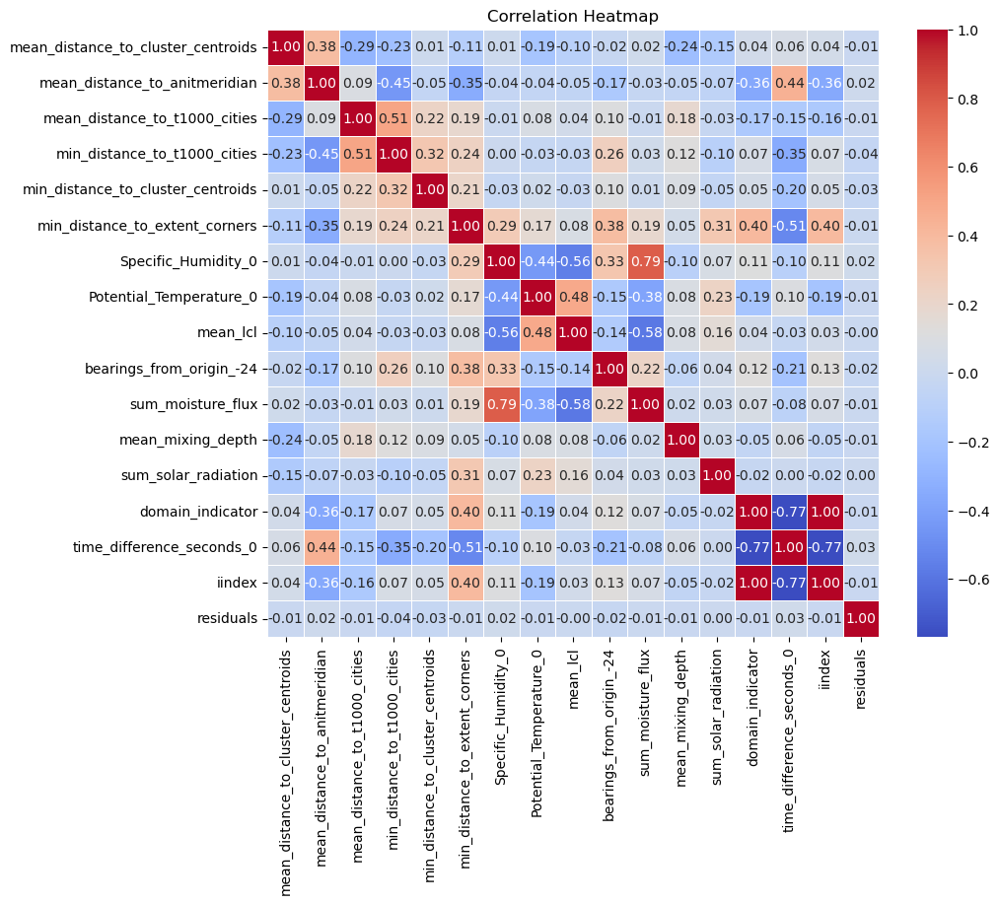

In [114]:
from sklearn.feature_selection import mutual_info_regression
ch4_test['residuals'] = ch4_residual_test
ch4_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(ch4_test.drop('residuals', axis=1), ch4_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': ch4_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = ch4_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

Average RF testing Morans I: -0.03121538461538462


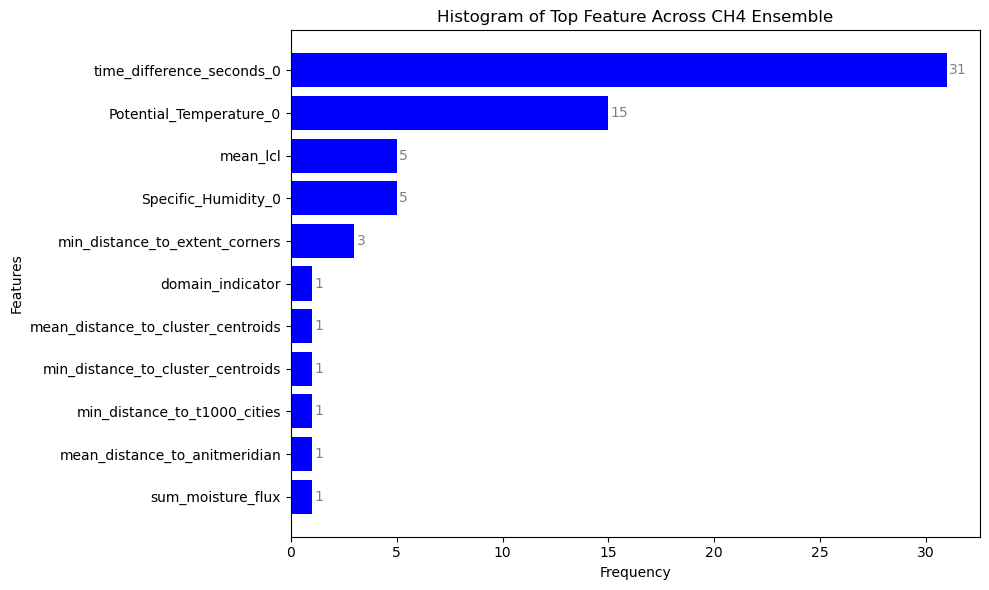

In [115]:
ats = "CH4"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='blue')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\2888394428.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtest['Datetime'] = pd.to_datetime(mtest['Datetime'])
C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\2888394428.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtest['Year'] = mtest['Datetime'].dt.year


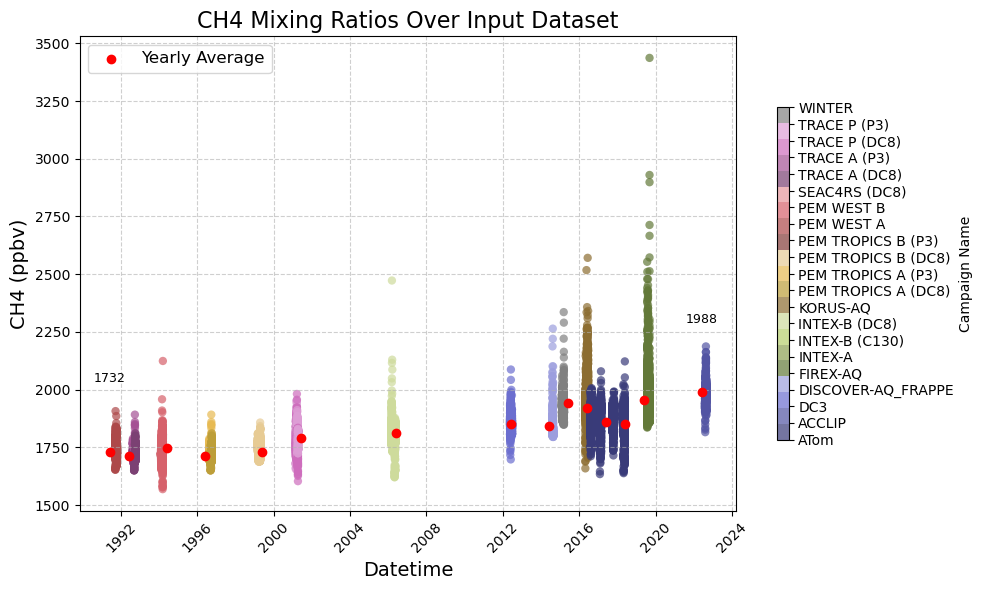

In [116]:
from matplotlib.colors import ListedColormap

# Extract the colors from tab20b
tab20_colors = plt.cm.tab20b(np.linspace(0, 1, 20))

# Add a 21st color by interpolating (or define a custom color explicitly)
extra_color = np.array([[0.5, 0.5, 0.5, 1.0]])  # A neutral gray as an example
# extra_color = np.array([[0.0, 1.0, 1.0, 1.0]])  # Cyan: full green, full blue, no red
custom_colors = np.vstack([tab20_colors, extra_color])

# Create a custom ListedColormap
custom_tab20_21 = ListedColormap(custom_colors, name='custom_tab20_21')


# Example dictionary mapping numeric labels to custom string labels
label_mapping = {
    0: "ATom",
    1: "ACCLIP",
    2: "DC3",
    3: "DISCOVER-AQ_FRAPPE",
    4: "FIREX-AQ",
    5: "INTEX-A",
    6: "INTEX-B (C130)",
    7: "INTEX-B (DC8)",
    8: "KORUS-AQ",
    9: "PEM TROPICS A (DC8)",
    10: "PEM TROPICS A (P3)",
    11: "PEM TROPICS B (DC8)",
    12: "PEM TROPICS B (P3)",
    13: "PEM WEST A",
    14: "PEM WEST B",
    15: "SEAC4RS (DC8)",
    16: "TRACE A (DC8)",
    17: "TRACE A (P3)",
    18: "TRACE P (DC8)",
    19: "TRACE P (P3)",
    20: "WINTER",
    # Add more mappings as needed
}


# Drop any rows with missing CH4 data
mtest = df.dropna(subset="CH4")

# Ensure 'Datetime' is a datetime object
mtest['Datetime'] = pd.to_datetime(mtest['Datetime'])

# Extract the year and month to calculate yearly averages
mtest['Year'] = mtest['Datetime'].dt.year

# Group by 'Year' and calculate the mean of 'CH4' for each year
yearly_avg = mtest.groupby('Year')['CH4'].mean().reset_index()

# Step 1: Convert Yearly Averages to Datetime (Set date to the middle of the year)
yearly_avg['Datetime'] = pd.to_datetime(yearly_avg['Year'].astype(str) + '-06-01')

# Step 2: Plot data and yearly averages
plt.figure(figsize=(10, 6))

# Scatter plot of the data
sc = plt.scatter(df['Datetime'], df['CH4'], c=df['domain_indicator'].values,  # Use numeric values for consistent coloring
    cmap=custom_tab20_21, alpha=0.7, edgecolor='none')

# Step 3: Plot the yearly averages as datetime points
plt.scatter(yearly_avg['Datetime'], yearly_avg['CH4'], color='red', label='Yearly Average', zorder=5)

# Step 4: Annotate only the first and last yearly averages
first_point = yearly_avg.iloc[0]
last_point = yearly_avg.iloc[-1]

# Annotating the first point
plt.annotate(f"{first_point['CH4']:.0f}",  # Display CH4 value with two decimal places
             (first_point['Datetime'], first_point['CH4']),  # Position the annotation at the point
             textcoords="offset points",  # Position relative to the point
             xytext=(0, 50),  # Slightly offset the label
             ha='center',  # Horizontal alignment to center
             fontsize=9,  # Font size of the label
             color='black')  # Color of the label

# Annotating the last point
plt.annotate(f"{last_point['CH4']:.0f}",  # Display CH4 value with two decimal places
             (last_point['Datetime'], last_point['CH4']),  # Position the annotation at the point
             textcoords="offset points",  # Position relative to the point
             xytext=(0, 50),  # Slightly offset the label
             ha='center',  # Horizontal alignment to center
             fontsize=9,  # Font size of the label
             color='black')  # Color of the label

# Update the colorbar to match the new number of labels
cbar = plt.colorbar(sc, orientation='vertical', pad=0.05, aspect=30, shrink=0.7)
cbar.set_label("Campaign Name")
cbar.set_ticks(range(len(label_mapping)))
cbar.set_ticklabels([label_mapping[i] for i in range(len(label_mapping))])

# Step 5: Customize the plot
plt.title('CH4 Mixing Ratios Over Input Dataset', fontsize=16)
plt.xlabel('Datetime', fontsize=14)
plt.ylabel('CH4 (ppbv)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=12)
plt.tight_layout()

# Step 6: Show the plot
plt.show()

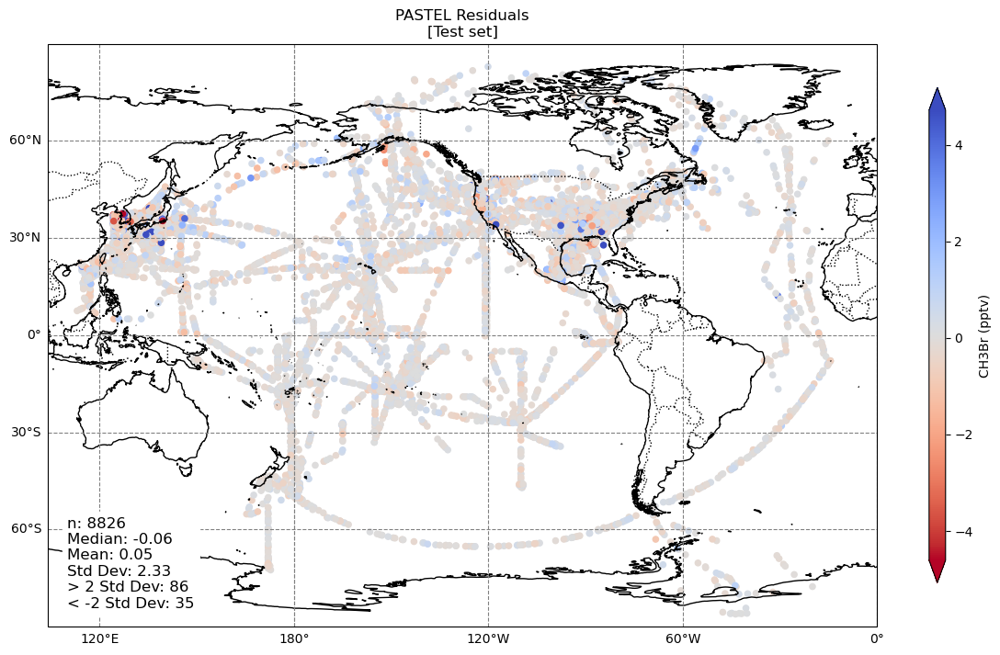

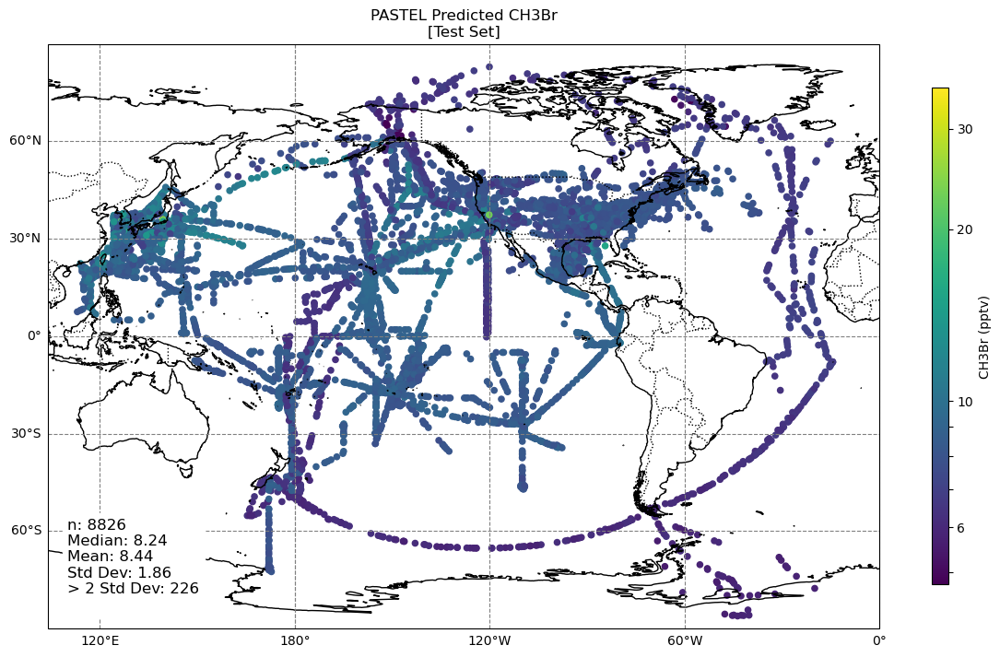

In [117]:
import matplotlib.ticker as ticker
# Open the file in binary read mode and load the object
# with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_CH3Br\data\CH3Br_global_X_train.pkl", 'rb') as file:
#     ch3br_train = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_CH3Br\data\CH3Br_global_X_test.pkl", 'rb') as file:
    ch3br_test = pickle.load(file)

# ch3br_residual_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_CH3Br\CH3Br_PASTEL_combined_residuals_train.npy")
ch3br_residual_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_CH3Br\CH3Br_PASTEL_combined_residuals_test.npy")
# ch3br_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_CH3Br\CH3Br_PASTEL_combined_pred_train.npy")
ch3br_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_CH3Br\CH3Br_PASTEL_combined_pred_test.npy")

ch3br_test['iindex'] = ch3br_test.index

merged_ch3br = ch3br_test.merge(df[['Latitude_0', 'Longitude_0']], left_on='iindex', right_index=True, how='left')

# Combine the residuals from both datasets to compute vmin and vmax
all_residuals = ch3br_residual_test #np.concatenate([dms_residual_train, dms_residual_test])

# Calculate the required statistics
mean_residual = np.mean(all_residuals)
median_residual = np.median(all_residuals)
std_residual = np.std(all_residuals)
above_2sd = np.sum(all_residuals > mean_residual + 2 * std_residual)
below_2sd = np.sum(all_residuals < mean_residual - 2 * std_residual)
n = len(all_residuals)

# Set up the color normalization (using linear scale)
norm = mcolors.Normalize(vmin=mean_residual - 2 * std_residual, vmax=mean_residual + 2 * std_residual)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_residual_train,  # Use numeric residuals for consistent coloring
#     cmap='coolwarm_r', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ch3br['Longitude_0'].values, 
    merged_ch3br['Latitude_0'].values, 
    c=ch3br_residual_test,  # Use numeric residuals for consistent coloring
    cmap='coolwarm_r', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7, extend='both')
cbar.set_label(f'CH3Br (pptv)')

# Title and labels
ax.set_title(f"PASTEL Residuals\n[Test set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_residual:.2f}\n"
              f"Mean: {mean_residual:.2f}\n"
              f"Std Dev: {std_residual:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
              f"< -2 Std Dev: {below_2sd}")
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CH3Br\CH3Br_residuals_test.png")
plt.tight_layout()
plt.show()

# Combine the residuals from both datasets to compute vmin and vmax
all_pred = ch3br_pred_test#np.concatenate([dms_pred_train, dms_pred_test])

# Calculate the required statistics
mean_pred = np.mean(all_pred)
median_pred = np.median(all_pred)
std_pred = np.std(all_pred)
above_2sd = np.sum(all_pred > mean_pred + 2 * std_pred)
below_2sd = np.sum(all_pred < mean_pred - 2 * std_pred)
n = len(all_pred)

min = np.min(all_pred)
max = np.max(all_pred)


norm = mcolors.LogNorm(vmin=np.min(ch3br_pred_test), vmax=np.max(ch3br_pred_test))


# Create the plot
fig, ax = plt.subplots(figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=240)})
ax.set_extent([-136, 120, -90, 90], crs=ccrs.PlateCarree(central_longitude=240))

# Add basemap features
ax.coastlines(resolution='50m')
ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':')
ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='white')
ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='white')

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle="--", color="gray")
gl.top_labels = gl.right_labels = False  # optional: turn off top/right labels for cleaner look

# # Plot the data for the training set
# sc0 = ax.scatter(
#     dms_train['Longitude_0'].values, 
#     dms_train['Latitude_0'].values, 
#     c=dms_pred_train,  # Use numeric residuals for consistent coloring
#     cmap='viridis', 
#     s=20, 
#     transform=ccrs.PlateCarree(),
#     norm=norm  # Apply the same normalization
# )

# Plot the data for the test set
sc1 = ax.scatter(
    merged_ch3br['Longitude_0'].values, 
    merged_ch3br['Latitude_0'].values, 
    c=ch3br_pred_test,  # Use numeric residuals for consistent coloring
    cmap='viridis', 
    s=20, 
    transform=ccrs.PlateCarree(),
    norm=norm  # Apply the same normalization
)

# Add the shared colorbar
cbar = plt.colorbar(sc1, ax=ax, orientation='vertical', pad=0.05, aspect=30, shrink=0.7,) #extend='both')
cbar.set_label(f'CH3Br (pptv)')

# Customize the ticks for a LogNorm colorbar
cbar.set_ticks(ticker.LogLocator(base=10.0, subs=np.arange(1.0, 10.0)*0.1, numticks=10), update=True)  # Minor ticks
cbar.minorticks_on()  # Ensure minor ticks are shown
cbar.ax.yaxis.set_minor_formatter(ticker.LogFormatter(base=10.0, labelOnlyBase=False))  # Label minor ticks
cbar.ax.yaxis.set_major_formatter(ticker.LogFormatter(base=10.0))  # Default major tick formatting

# Title and labels
ax.set_title(f"PASTEL Predicted CH3Br\n[Test Set]")

# Annotate the statistics in the lower left corner
stats_text = (f"n: {n:.0f}\n"
              f"Median: {median_pred:.2f}\n"
              f"Mean: {mean_pred:.2f}\n"
              f"Std Dev: {std_pred:.2f}\n"
              f"> 2 Std Dev: {above_2sd}\n"
            #   f"< -2 Std Dev: {below_2sd}"
            )
ax.text(-130, -85, stats_text, fontsize=12, color='black', ha='left', va='bottom', backgroundcolor='white')

# Save and display the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\plots\CH3Br\CH3Br_combined_pred_test.png")
plt.tight_layout()
plt.show()

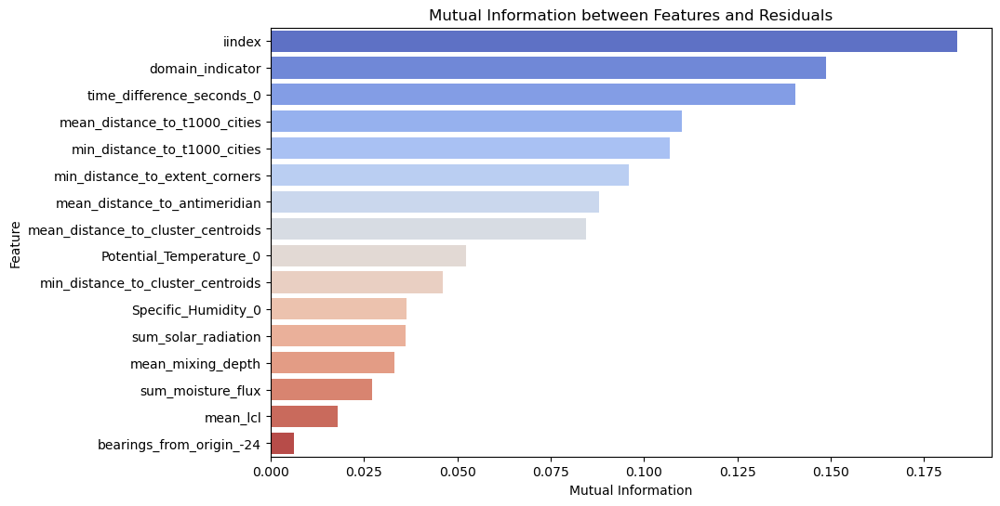

                               Feature  Mutual Information
15                              iindex            0.183859
13                    domain_indicator            0.148664
14           time_difference_seconds_0            0.140546
2        mean_distance_to_t1000_cities            0.110124
3         min_distance_to_t1000_cities            0.106941
5       min_distance_to_extent_corners            0.095959
1        mean_distance_to_antimeridian            0.087979
0   mean_distance_to_cluster_centroids            0.084424
7              Potential_Temperature_0            0.052442
4    min_distance_to_cluster_centroids            0.046188
6                  Specific_Humidity_0            0.036498
12                 sum_solar_radiation            0.036070
11                   mean_mixing_depth            0.033221
10                   sum_moisture_flux            0.027109
8                             mean_lcl            0.017966
9             bearings_from_origin_-24            0.0063

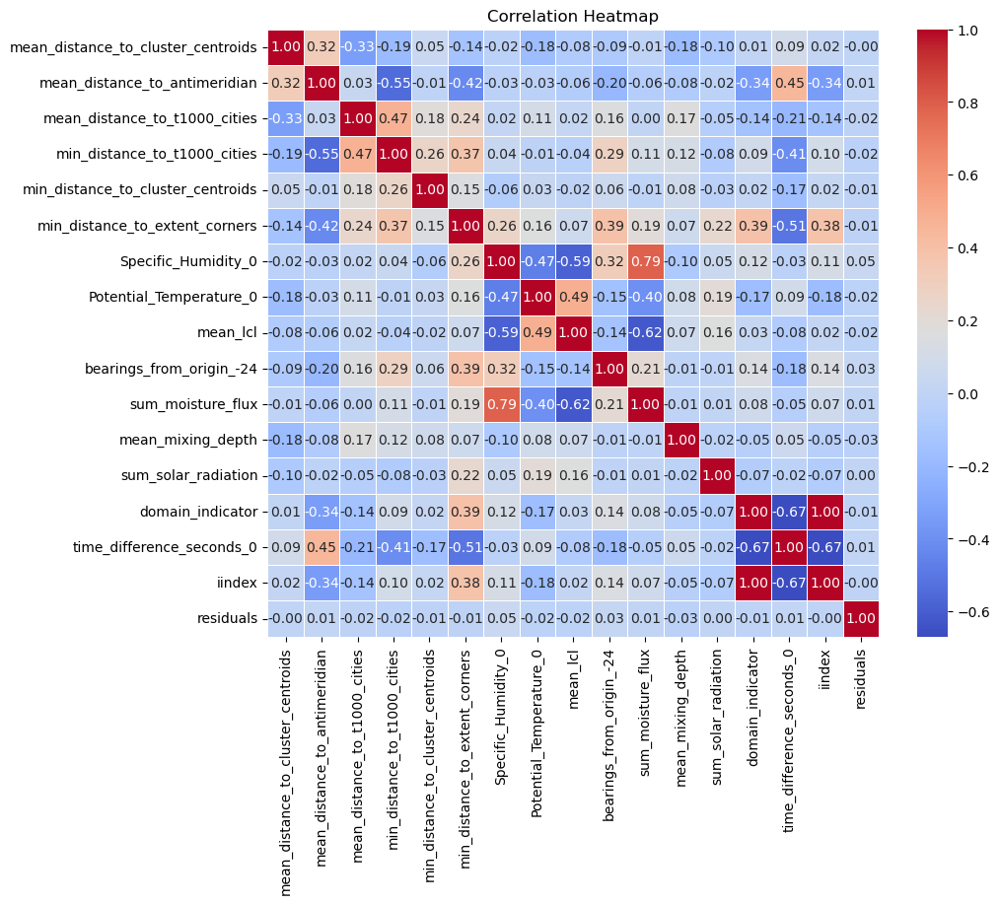

In [118]:
from sklearn.feature_selection import mutual_info_regression
ch3br_test['residuals'] = ch3br_residual_test
ch3br_test.dropna(inplace=True)
# Compute mutual information between residuals and other features
mutual_info = mutual_info_regression(ch3br_test.drop('residuals', axis=1), ch3br_test['residuals'])

# Create a DataFrame to pair features with their mutual information scores
mutual_info_df = pd.DataFrame({
    'Feature': ch3br_test.drop('residuals', axis=1).columns,  # Feature names
    'Mutual Information': mutual_info  # Corresponding mutual information scores
})

# Sort the DataFrame by mutual information scores in descending order
mutual_info_df = mutual_info_df.sort_values(by='Mutual Information', ascending=False)

# Plot the mutual information scores
plt.figure(figsize=(10, 6))
sns.barplot(x='Mutual Information', y='Feature', data=mutual_info_df, palette='coolwarm')
plt.title('Mutual Information between Features and Residuals')
plt.xlabel('Mutual Information')
plt.ylabel('Feature')
plt.show()
print(mutual_info_df)

with open(os.path.join(r"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\PASTEL_combined\V4_CH4", f"combined_MI_residuals.pkl"), "wb") as f:
    pickle.dump(mutual_info_df, f)

# Calculate the correlation matrix for all features with respect to residuals
correlation_matrix = ch3br_test.corr(method='pearson')

# Extract the correlation values for 'residuals' with all other variables
residuals_corr = correlation_matrix['residuals']

# Sort the correlations to find the most positively or negatively correlated variables
sorted_residuals_corr = residuals_corr.sort_values(ascending=False)

# Print the sorted correlations
print(sorted_residuals_corr)

# Create a heatmap of the correlation matrix (for visualization)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [119]:
ch3br_snr = np.var(ch3br_pred_test) / np.var(ch3br_residual_test)
ch3br_snr

0.6331105398571382

Average RF testing Morans I: -0.011784615384615383


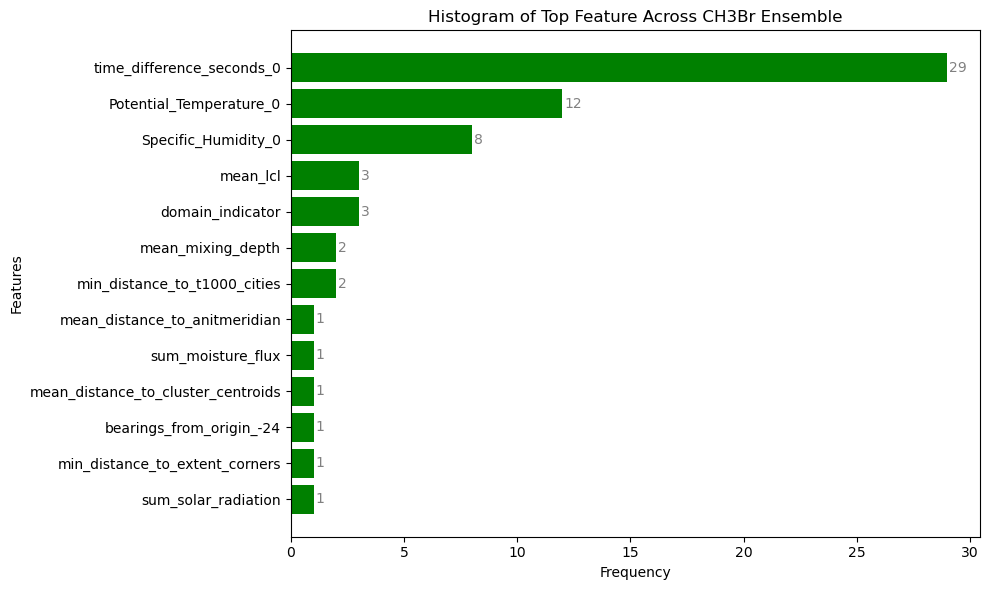

In [120]:
ats = "CH3Br"

# Open the file in binary read mode and load the object
with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble\{ats}_cluster_stats.pkl", 'rb') as file:
    var_cluster_stats = pickle.load(file)

test_mi = []
for i in var_cluster_stats.keys():
    test_mi.append(var_cluster_stats[i]['moran_I_test_RF'])

print(f"Average RF testing Morans I: {np.average(test_mi)}")

input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_anitmeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

var_cluster_stats[0]['sorted_idx']

efid = []
for i in var_cluster_stats.keys():
    efid.append(var_cluster_stats[i]['sorted_idx'])

# Extract the top 3 feature indices across all ensemble members
top_features = []
for entry in efid:
    top_features.extend(entry[-1:])  # Get the last 3 indices

# Convert indices to feature names
top_feature_names = [input_features[i] for i in top_features]

# Count occurrences of each feature
feature_counts = Counter(top_feature_names)

# Sort the feature counts by frequency (value) in descending order
sorted_features = sorted(feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_counts = zip(*sorted_features)

# Plot sorted histogram as horizontal bars
plt.figure(figsize=(10, 6))
bars = plt.barh(sorted_feature_names, sorted_counts, color='green')

# Add value labels on bars
for bar, count in zip(bars, sorted_counts):
    plt.text(
        bar.get_width() + 0.1,  # X-coordinate of text (just beyond the bar's length)
        bar.get_y() + bar.get_height() / 2,  # Y-coordinate of text (centered vertically on the bar)
        str(count),  # Text to display
        va='center', color='gray', fontsize=10
    )

plt.gca().invert_yaxis()  # Invert Y-axis to have the most important feature at the top
plt.title(f'Histogram of Top Feature Across {ats} Ensemble')
plt.xlabel('Frequency')
plt.ylabel('Features')
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble\regional_ensemble\V4_{ats}\{ats}_re_feature_importances_composite.png")
plt.tight_layout()
plt.show()

In [121]:
print(df['CH3Br'].mean())
print(df['CH3Br'].std())
print(df['CH3Br'].var())


8.51673133551962
4.0568445596590506
16.457987781235236


In [122]:
# Calculate mean and standard deviation
mean = df['CH3Br'].mean()
std = df['CH3Br'].std()

# Calculate range for 2 standard deviations
lower_bound = mean - 2 * std
upper_bound = mean + 2 * std

# Filter and count
within_range = df[(df['CH3Br'] >= lower_bound) & (df['CH3Br'] <= upper_bound)]
count_within_range = within_range.shape[0]

print(f"Number of samples within 2 standard deviations: {count_within_range}")

Number of samples within 2 standard deviations: 43685


In [123]:
non_nan_count = df['CH3Br'].notna().sum()
print(f"Number of non-NaN values: {non_nan_count}")

Number of non-NaN values: 44215


In [124]:
average_concentration = df.groupby('domain_indicator')['CH3Br'].mean().reset_index()
print(average_concentration.sort_values(by="CH3Br"))

    domain_indicator      CH3Br
0                  0   6.586310
1                  1   7.392931
4                  4   7.812987
2                  2   8.096135
5                  5   8.161812
20                20   8.218559
7                  7   8.237044
3                  3   8.274398
15                15   8.302548
6                  6   8.322000
11                11   8.479069
16                16   8.695873
9                  9   8.696234
12                12   8.737377
18                18   8.883962
10                10   9.120902
17                17   9.120902
19                19   9.445586
14                14  10.323687
8                  8  11.492991
13                13        NaN


C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\2152012809.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtest['Datetime'] = pd.to_datetime(mtest['Datetime'])
C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\2152012809.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mtest['Year'] = mtest['Datetime'].dt.year


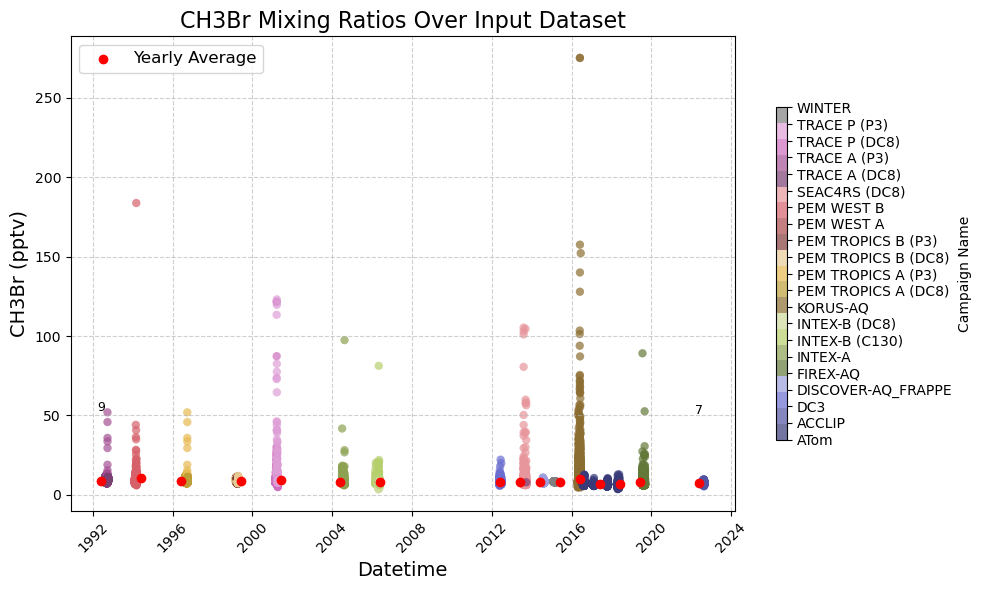

In [125]:
from matplotlib.colors import ListedColormap

# Extract the colors from tab20b
tab20_colors = plt.cm.tab20b(np.linspace(0, 1, 20))

# Add a 21st color by interpolating (or define a custom color explicitly)
extra_color = np.array([[0.5, 0.5, 0.5, 1.0]])  # A neutral gray as an example
# extra_color = np.array([[0.0, 1.0, 1.0, 1.0]])  # Cyan: full green, full blue, no red
custom_colors = np.vstack([tab20_colors, extra_color])

# Create a custom ListedColormap
custom_tab20_21 = ListedColormap(custom_colors, name='custom_tab20_21')


# Example dictionary mapping numeric labels to custom string labels
label_mapping = {
    0: "ATom",
    1: "ACCLIP",
    2: "DC3",
    3: "DISCOVER-AQ_FRAPPE",
    4: "FIREX-AQ",
    5: "INTEX-A",
    6: "INTEX-B (C130)",
    7: "INTEX-B (DC8)",
    8: "KORUS-AQ",
    9: "PEM TROPICS A (DC8)",
    10: "PEM TROPICS A (P3)",
    11: "PEM TROPICS B (DC8)",
    12: "PEM TROPICS B (P3)",
    13: "PEM WEST A",
    14: "PEM WEST B",
    15: "SEAC4RS (DC8)",
    16: "TRACE A (DC8)",
    17: "TRACE A (P3)",
    18: "TRACE P (DC8)",
    19: "TRACE P (P3)",
    20: "WINTER",
    # Add more mappings as needed
}


# Drop any rows with missing CH4 data
mtest = df.dropna(subset="CH3Br")

# Ensure 'Datetime' is a datetime object
mtest['Datetime'] = pd.to_datetime(mtest['Datetime'])

# Extract the year and month to calculate yearly averages
mtest['Year'] = mtest['Datetime'].dt.year

# Group by 'Year' and calculate the mean of 'CH4' for each year
yearly_avg = mtest.groupby('Year')["CH3Br"].mean().reset_index()

# Step 1: Convert Yearly Averages to Datetime (Set date to the middle of the year)
yearly_avg['Datetime'] = pd.to_datetime(yearly_avg['Year'].astype(str) + '-06-01')

# Step 2: Plot data and yearly averages
plt.figure(figsize=(10, 6))

# Scatter plot of the data
sc = plt.scatter(df['Datetime'], df["CH3Br"], c=df['domain_indicator'].values,  # Use numeric values for consistent coloring
    cmap=custom_tab20_21, alpha=0.7, edgecolor='none')

# Step 3: Plot the yearly averages as datetime points
plt.scatter(yearly_avg['Datetime'], yearly_avg["CH3Br"], color='red', label='Yearly Average', zorder=5)

# Step 4: Annotate only the first and last yearly averages
first_point = yearly_avg.iloc[0]
last_point = yearly_avg.iloc[-1]

# Annotating the first point
plt.annotate(f"{first_point['CH3Br']:.0f}",  # Display CH4 value with two decimal places
             (first_point['Datetime'], first_point["CH3Br"]),  # Position the annotation at the point
             textcoords="offset points",  # Position relative to the point
             xytext=(0, 50),  # Slightly offset the label
             ha='center',  # Horizontal alignment to center
             fontsize=9,  # Font size of the label
             color='black')  # Color of the label

# Annotating the last point
plt.annotate(f"{last_point['CH3Br']:.0f}",  # Display CH4 value with two decimal places
             (last_point['Datetime'], last_point["CH3Br"]),  # Position the annotation at the point
             textcoords="offset points",  # Position relative to the point
             xytext=(0, 50),  # Slightly offset the label
             ha='center',  # Horizontal alignment to center
             fontsize=9,  # Font size of the label
             color='black')  # Color of the label

# Update the colorbar to match the new number of labels
cbar = plt.colorbar(sc, orientation='vertical', pad=0.05, aspect=30, shrink=0.7)
cbar.set_label("Campaign Name")
cbar.set_ticks(range(len(label_mapping)))
cbar.set_ticklabels([label_mapping[i] for i in range(len(label_mapping))])

# Step 5: Customize the plot
plt.title('CH3Br Mixing Ratios Over Input Dataset', fontsize=16)
plt.xlabel('Datetime', fontsize=14)
plt.ylabel('CH3Br (pptv)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45, fontsize=10)
plt.legend(fontsize=12)
plt.tight_layout()

# Step 6: Show the plot
plt.show()

In [126]:
from sklearn.metrics import r2_score
from sklearn.metrics import d2_absolute_error_score
from sklearn.metrics import mean_squared_error
# from sklearn.metrics import root_mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
from sklearn.metrics import max_error

# Define a function that calcualte error metrics from predicted and actual values
def reg_model_metrics(actual,pred):
    MSE = mean_squared_error(actual,pred)
    RMSE = np.sqrt(MSE)
    actual_mean = np.mean(actual)
    RRMSE = 100*RMSE/actual_mean
    MAE = mean_absolute_error(actual, pred)
    R2 = r2_score(actual,pred)
    D2 = d2_absolute_error_score(actual, pred)
    MAXErr = max_error(actual, pred)
    EVS = explained_variance_score(actual, pred)
    return MSE, RMSE, RRMSE, MAE, R2, D2, MAXErr, EVS


def scatter_plot(actual, pred, title, var_of_int, unit_label, comp_flag, save_path):
    # Color Matching for clarity
    if var_of_int == 'CH4':
        color = 'blue'
        cm = 'Blues'
    elif var_of_int == 'DMS':
        color = 'purple'
        cm = 'Purples'
    elif var_of_int == 'CO':
        color = 'cyan'
        cm = 'YlGnBu'
    elif var_of_int == 'O3':
        color = 'gold'
        cm = 'YlOrBr'
    elif var_of_int == 'Benzene':
        color = 'red'
        cm = 'Reds'
    elif var_of_int == 'CH3Br':
        color = 'mediumseagreen'
        cm = 'Greens'
    elif var_of_int == 'Ethane':
        color = 'orange'
        cm = 'Oranges'
    else:
        color = 'gray'
        cm = 'Greys'
        
    if comp_flag:
        cm = "Greys"
    
    MSE, RMSE, RRMSE, MAE, R2, D2, MAXErr, EVS = reg_model_metrics(actual, pred)
        
    fig,ax = plt.subplots(figsize=(8, 6))
    ax.scatter(actual, pred, edgecolors=(0,0,0), c=color, cmap=cm)
    ax.plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'r--', lw=2)
    text = r"R2 = %.2f" % (R2); text += "\n";
    text += r"D2 = %.2f" % (D2); text += "\n";
    text += r"MAE = %.2f" % (MAE); text += "\n";
    text += r"MSE = %.2f" % (MSE); text += "\n";
    text += r"RMSE = %.2f" % (RMSE);     
    plt.annotate(text, xy=(0.01, 0.9), xycoords='axes fraction',color='black', fontsize=10,bbox=dict(facecolor='none', edgecolor='none'))
    ax.set_xlabel(f'Measured {var_of_int} {unit_label}')
    ax.set_ylabel(f'Predicted {var_of_int} {unit_label}')
    # Set log scale for x and y axes
    # ax.set_xscale('log')
    # ax.set_yscale('log')
    # # if var_of_int != 'DMS':
    # # Create locators to specify the ticks on both axes
    # ax.xaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))  # Controls major ticks
    # ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs="auto"))  # Controls minor ticks

    # ax.yaxis.set_major_locator(ticker.LogLocator(base=10.0, numticks=10))
    # ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs="auto"))

    # Ensure minor gridlines are visible and major gridlines are configured
    ax.grid(visible=True, which="major", linestyle="--", linewidth=0.5)  # Major gridlines
    ax.grid(visible=True, which="minor", linestyle=":", linewidth=0.5)  # Minor gridlines
    ax.set_title(title)
    # plt.grid()
    plt.savefig(save_path)
    # plt.show()
    plt.clf()
    return None

In [127]:
# Open the file in binary read mode and load the object
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_Ethane\data\Ethane_global_y_train.pkl", 'rb') as file:
    ethane_train_y = pickle.load(file)
with open(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\global_models\V4_Ethane\data\Ethane_global_y_test.pkl", 'rb') as file:
    ethane_test_y = pickle.load(file)

ethane_pred_train = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_pred_train.npy")
ethane_pred_test = np.load(r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane\Ethane_PASTEL_combined_pred_test.npy")

In [128]:
save_path = r"C:\Users\vwgei\Documents\PVOCAL\ensemble\PASTEL_combined\V4_Ethane"

# Visulize predictions on training set
title = f'Training Results: Ethane [PASTEL - combined]'
scatter_plot(ethane_train_y, ethane_pred_train, title, 'Ethane', 'pptv', False, os.path.join(save_path, f"PASTEL_Ethane_train_linear.png"))
# Visulize predictions on testing set
title = f'Testing Results: Ethane [PASTEL - combined]'
scatter_plot(ethane_test_y, ethane_pred_test, title, 'Ethane', 'pptv', False, os.path.join(save_path, f"PASTEL_Ethane_test_linear.png"))

C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\822597797.py:56: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(actual, pred, edgecolors=(0,0,0), c=color, cmap=cm)
C:\Users\vwgei\AppData\Local\Temp\ipykernel_24472\822597797.py:56: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(actual, pred, edgecolors=(0,0,0), c=color, cmap=cm)


<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [129]:
# Calculate Moran's I and p-value
I_dms, p_value_dms = morans_I(merged_dms, dms_residual_test, threshold=110000, crs_epsg=3395, permutations=100)
print(f"Observed Moran's I [DMS]: {round(I_dms, 4)}")
print(f"P-value [DMS]: {round(p_value_dms, 4)}")

dms_snr = np.var(dms_pred_test) / np.var(dms_residual_test)
print(f"DMS SNR: {round(dms_snr, 4)}")

I_ethane, p_value_ethane = morans_I(merged_ethane, ethane_residual_test, threshold=110000, crs_epsg=3395, permutations=100)
print(f"Observed Moran's I [Ethane]: {round(I_ethane, 4)}")
print(f"P-value [Ethane]: {round(p_value_ethane, 4)}")

ethane_snr = np.var(ethane_pred_test) / np.var(ethane_residual_test)
print(f"Ethane SNR: {round(ethane_snr, 4)}")

I_co, p_value_co = morans_I(merged_co, co_residual_test, threshold=110000, crs_epsg=3395, permutations=1000)
print(f"Observed Moran's I [CO]: {round(I_co, 4)}")
print(f"P-value [CO]: {round(p_value_co, 4)}")

co_snr = np.var(co_pred_test) / np.var(co_residual_test)
print(f"CO SNR: {round(co_snr, 4)}")

I_o3, p_value_o3 = morans_I(merged_o3, o3_residual_test, threshold=110000, crs_epsg=3395, permutations=100)
print(f"Observed Moran's I [O3]: {round(I_o3, 4)}")
print(f"P-value [O3]: {round(p_value_o3, 4)}")

o3_snr = np.var(o3_pred_test) / np.var(o3_residual_test)
print(f"O3 SNR: {round(o3_snr, 4)}")

I_ch4, p_value_ch4 = morans_I(merged_ch4, ch4_residual_test, threshold=110000, crs_epsg=3395, permutations=100)
print(f"Observed Moran's I [CH4]: {round(I_ch4, 4)}")
print(f"P-value [CH4]: {round(p_value_ch4, 4)}")

ch4_snr = np.var(ch4_pred_test) / np.var(ch4_residual_test)
print(f"CH4 SNR: {round(ch4_snr, 4)}")

I_ch3br, p_value_ch3br = morans_I(merged_ch3br, ch3br_residual_test, threshold=110000, crs_epsg=3395, permutations=1000)
print(f"Observed Moran's I [CH3Br]: {round(I_ch3br, 4)}")
print(f"P-value [CH3Br]: {round(p_value_ch3br, 4)}")

ch3br_snr = np.var(ch3br_pred_test) / np.var(ch3br_residual_test)
print(f"CH3Br SNR: {round(ch3br_snr, 4)}")

Observed Moran's I [DMS]: 0.0975
P-value [DMS]: 0.0099
DMS SNR: 5.4739
Observed Moran's I [Ethane]: 0.0486
P-value [Ethane]: 0.0099
Ethane SNR: 1.4717
Observed Moran's I [CO]: 0.0056
P-value [CO]: 0.041
CO SNR: 1.5655
Observed Moran's I [O3]: 0.0125
P-value [O3]: 0.0099
O3 SNR: 6.6084
Observed Moran's I [CH4]: 0.051
P-value [CH4]: 0.0099
CH4 SNR: 12.9841
Observed Moran's I [CH3Br]: 0.008
P-value [CH3Br]: 0.022
CH3Br SNR: 0.6331


CH3Br: Average RF testing Morans I: -0.011784615384615383
CH4: Average RF testing Morans I: -0.03121538461538462
CO: Average RF testing Morans I: 0.008692307692307695
DMS: Average RF testing Morans I: -0.11115384615384614
Ethane: Average RF testing Morans I: 0.018492307692307693
O3: Average RF testing Morans I: 0.012307692307692308


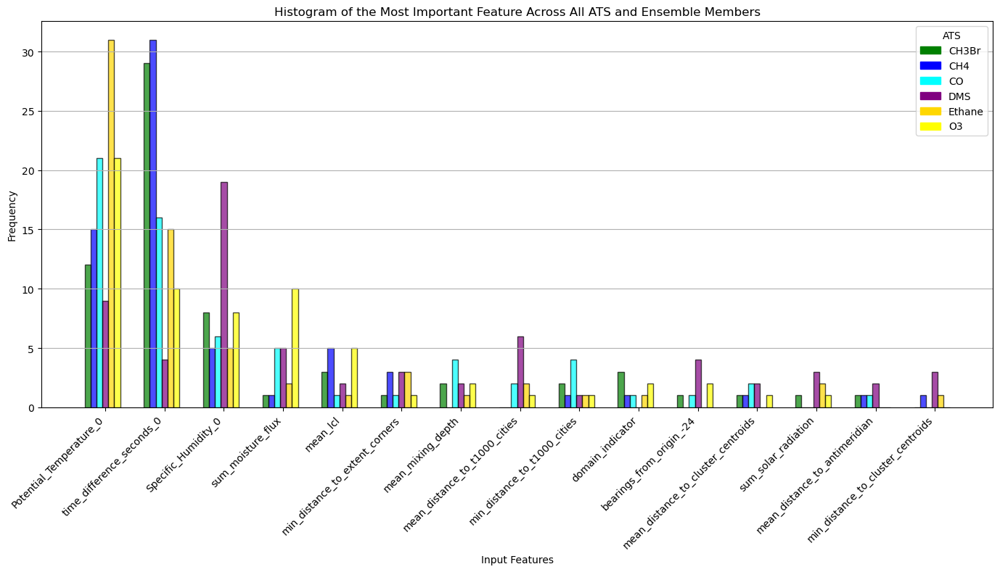

In [130]:
import pickle
import numpy as np
from collections import Counter, defaultdict
import matplotlib.pyplot as plt

# List of ATS to process and color mapping
ats_list = ["CH3Br", "CH4", "CO", "DMS", "Ethane", "O3",]  # Add all your ATS here
ats_color_mapping = {"DMS": 'purple', "Ethane": "gold", "CH4": 'blue', "O3": 'yellow', "CO": 'cyan', "CH3Br": 'green'}

# Input feature names
input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_antimeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0',
]

# Initialize a dictionary to track feature occurrences by ATS
feature_ats_mapping = defaultdict(list)

# Loop through each ATS and process the data
for ats in ats_list:
    if ats == "CH3Br":
        with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble\{ats}_cluster_stats.pkl", 'rb') as file:
            var_cluster_stats = pickle.load(file)
    elif ats == "Ethane":
        with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble\{ats}_cluster_stats.pkl", 'rb') as file:
            var_cluster_stats = pickle.load(file)
    else:        
        with open(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\{ats}_cluster_stats.pkl", 'rb') as file:
            var_cluster_stats = pickle.load(file)

    test_mi = [var_cluster_stats[i]['moran_I_test_RF'] for i in var_cluster_stats.keys()]
    print(f"{ats}: Average RF testing Morans I: {np.average(test_mi)}")

    efid = [var_cluster_stats[i]['sorted_idx'] for i in var_cluster_stats.keys()]

    # Extract the top features (e.g., top 3 indices for simplicity)
    top_features = []
    for entry in efid:
        top_features.extend(entry[-1:])  # Adjust slice to [-3:] for top 3 indices if needed

    # Convert indices to feature names and associate with ATS
    top_feature_names = [input_features[i] for i in top_features]
    for feature in top_feature_names:
        feature_ats_mapping[feature].append(ats)

# Count occurrences of each feature grouped by ATS
aggregate_feature_counts = {feature: Counter(ats_list) for feature, ats_list in feature_ats_mapping.items()}

# Calculate total counts for each feature
total_feature_counts = {feature: sum(counts.values()) for feature, counts in aggregate_feature_counts.items()}

# Sort features by total count in descending order
sorted_features_by_total = sorted(total_feature_counts.items(), key=lambda x: x[1], reverse=True)
sorted_features = [item[0] for item in sorted_features_by_total]

# Flatten the counts and colors for plotting, sorted by total count
features = []
colors = []
counts = []
bar_width = 0.15  # Bar width for multi-bar plot (you can adjust this as needed)
index = np.arange(len(sorted_features))  # Positions for the bars

# Adjust the gap between feature groups
gap_between_groups = 1.5  # Increase this value to add more space between features
adjusted_index = np.arange(len(sorted_features)) * gap_between_groups  # Adjusted positions for groups

# Prepare data for grouped bars
for feature in sorted_features:  # Use the sorted features
    ats_counts = aggregate_feature_counts[feature]
    for i, ats in enumerate(ats_list):
        count = ats_counts[ats] if ats in ats_counts else 0
        features.append(feature)
        colors.append(ats_color_mapping[ats])
        counts.append(count)

# Create the grouped bar plot
plt.figure(figsize=(14, 8))

# Plot bars for each feature and ATS with offset
for i, (feature, color, count) in enumerate(zip(features, colors, counts)):
    # Offset each ATS bar for each feature
    feature_index = sorted_features.index(feature)
    bar_position = adjusted_index[feature_index] + (i % len(ats_list)) * bar_width - (len(ats_list) // 2) * bar_width
    bar = plt.bar(bar_position, count, color=color, width=bar_width, alpha=0.7, edgecolor='black')

    # # Add value labels on bars
    # plt.text(
    #     bar_position,  # X-coordinate of text
    #     count + 0.2,  # Y-coordinate of text, adding some space above the bar
    #     str(count),  # Text to display
    #     ha='center', va='bottom', fontsize=10, color='black'  # Adjust text position and style
    # )

# Customize plot labels and title
plt.xticks(adjusted_index, sorted_features, rotation=45, ha='right')  # Rotate and align feature names
plt.title('Histogram of the Most Important Feature Across All ATS and Ensemble Members')
plt.xlabel('Input Features')
plt.ylabel('Frequency')

# Add some space between feature names
plt.subplots_adjust(bottom=0.2)

# Add legend
handles = [plt.Rectangle((0, 0), 1, 1, color=ats_color_mapping[ats]) for ats in ats_list]
plt.legend(handles, ats_list, title="ATS")

plt.grid(axis='y')

# Tight layout
plt.tight_layout()

# Save the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\aggregated_feature_importances_sorted_grouped_bars_with_whitespace.png")
plt.show()


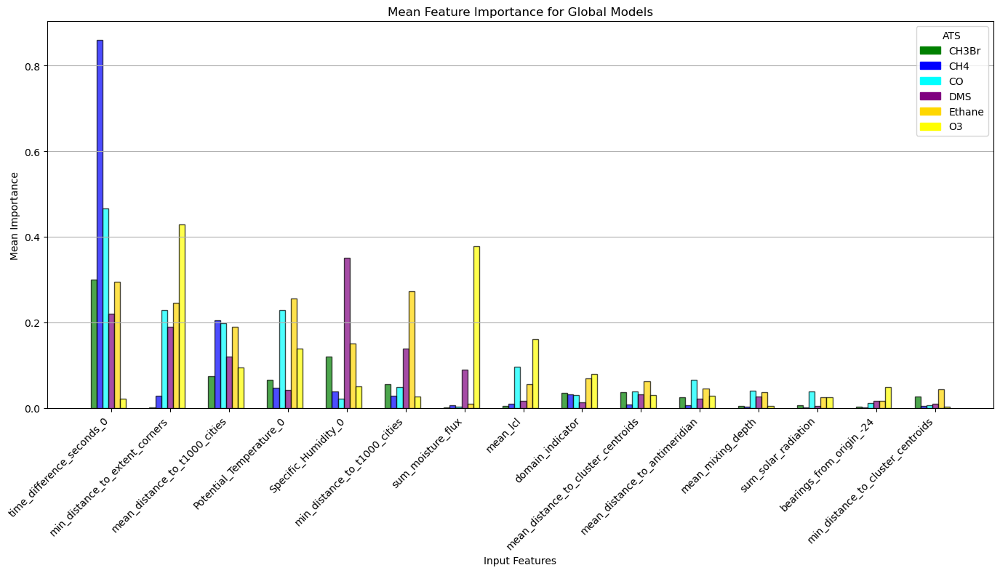

In [131]:
# Input Feature names and corresponding mean feature importances for each ATS
input_features = [
    'mean_distance_to_cluster_centroids', 'mean_distance_to_antimeridian', 'mean_distance_to_t1000_cities',
    'min_distance_to_t1000_cities', 'min_distance_to_cluster_centroids', 'min_distance_to_extent_corners',
    'Specific_Humidity_0', 'Potential_Temperature_0', 'mean_lcl', 'bearings_from_origin_-24',
    'sum_moisture_flux', 'mean_mixing_depth', 'sum_solar_radiation', 'domain_indicator', 'time_difference_seconds_0'
]

# Mean feature importances for each ATS
importances = {
    'CH3Br': [0.037,0.025,0.075,0.055,0.026,0.001,0.12,0.065,0.004,0.003,0.002,0.005,0.007,0.036,0.3],
    'CH4': [0.008, 0.006, 0.205, 0.029, 0.004, 0.028, 0.039, 0.047, 0.009, 0.001, 0.007, 0.003, 0.002, 0.032, 0.86],
    'CO': [0.038, 0.065, 0.198, 0.048, 0.007, 0.228, 0.021, 0.228, 0.097, 0.011, 0.003, 0.04, 0.039, 0.03, 0.466],
    'DMS': [0.032, 0.021, 0.12, 0.138, 0.009, 0.19, 0.351, 0.042, 0.017, 0.016, 0.09, 0.027, 0.005, 0.014, 0.22],
    'Ethane': [0.062,0.046,0.19,0.272,0.043,0.245,0.15,0.255,0.055,0.017,0.01,0.037,0.025,0.07,0.295],
    'O3': [0.03, 0.028, 0.095, 0.027, 0.003, 0.428, 0.05, 0.138, 0.16, 0.048, 0.378, 0.005, 0.025, 0.08, 0.021]
}

# Define color mapping for ATS
ats_color_mapping = {
    "CH3Br": 'green', "CH4": 'blue', "CO": 'cyan', "DMS": 'purple', "Ethane": 'gold', "O3": 'yellow'
}

# Step 1: Calculate the total importance for each feature
feature_totals = []
for feature in input_features:
    total_importance = sum(importances[ats][input_features.index(feature)] for ats in ats_color_mapping.keys())
    feature_totals.append((feature, total_importance))

# Step 2: Sort features by total importance (descending order)
sorted_features_by_total = sorted(feature_totals, key=lambda x: x[1], reverse=True)

# Step 3: Extract the sorted feature names and their corresponding importance values
sorted_features = [item[0] for item in sorted_features_by_total]

# Step 4: Extract importance values and colors for plotting
sorted_importances = []
sorted_colors = []
for feature in sorted_features:
    sorted_importances.append([importances[ats][input_features.index(feature)] for ats in ats_color_mapping.keys()])
    sorted_colors.append([ats_color_mapping[ats] for ats in ats_color_mapping.keys()])

# Setup the bar width and adjust spacing between features
bar_width = 0.15  # Width of each bar
gap_between_groups = 1.5  # Gap between groups of bars
index = np.arange(len(sorted_features))  # Base positions for features

# Adjusted positions for the grouped bars
adjusted_index = np.arange(len(sorted_features)) * gap_between_groups

# Create the grouped bar plot
plt.figure(figsize=(14, 8))

# Plot bars for each feature and ATS with offset
for i, (feature, color, count_list) in enumerate(zip(sorted_features, sorted_colors, sorted_importances)):
    for j, (count, color) in enumerate(zip(count_list, ats_color_mapping.values())):
        bar_position = adjusted_index[i] + (j % len(ats_color_mapping)) * bar_width - (len(ats_color_mapping) // 2) * bar_width
        bar = plt.bar(bar_position, count, color=color, width=bar_width, alpha=0.7, edgecolor='black')

        # # Add value labels on bars
        # plt.text(
        #     bar_position,  # X-coordinate of text
        #     count + 0.02,  # Y-coordinate of text, adding some space above the bar
        #     f"{count:.3f}",  # Display value rounded to 3 decimal places
        #     ha='center', va='bottom', fontsize=10, color='black'  # Adjust text position and style
        # )

# Customize plot labels and title
plt.xticks(adjusted_index, sorted_features, rotation=45, ha='right')  # Rotate and align feature names
plt.title('Mean Feature Importance for Global Models')
plt.xlabel('Input Features')
plt.ylabel('Mean Importance')

# Add some space between feature names
plt.subplots_adjust(bottom=0.2)

# Add legend
handles = [plt.Rectangle((0, 0), 1, 1, color=ats_color_mapping[ats]) for ats in ats_color_mapping]
plt.legend(handles, ats_color_mapping.keys(), title="ATS")
plt.grid(axis='y')

# Tight layout
plt.tight_layout()

# Save the plot
plt.savefig(rf"C:\Users\vwgei\Documents\PVOCAL\ensemble_working\global_model_sorted_mean_feature_importances.png")
plt.show()

In [132]:
# # Calculate the mean and standard deviation of the 'CO' column
# mean_CO = df['CO'].mean()
# std_CO = df['CO'].std()

# # Define the cutoff for 3 standard deviations
# cutoff_lower = mean_CO - 2 * std_CO
# cutoff_upper = mean_CO + 2 * std_CO

# # Filter the DataFrame to keep only values within 3 standard deviations
# df_filtered = df[(df['CO'] >= cutoff_lower) & (df['CO'] <= cutoff_upper)]

# plt.scatter(df_filtered['time_index'], df_filtered['CO'])

In [133]:
# # Create the scatter plot
# plt.figure(figsize=(10, 6))
# plt.scatter(datetimes, CO, color='orange', alpha=0.7, edgecolor='k')

# # Customize the plot
# plt.title('Scatter Plot of CO Mixing Ratios Over Time', fontsize=16)
# plt.xlabel('Datetime', fontsize=14)
# plt.ylabel('CO (ppbv)', fontsize=14)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.xticks(rotation=45, fontsize=10)
# plt.tight_layout()
# # plt.xscale('log')
# # plt.yscale('log')

# # Show the plot
# plt.show()

In [134]:
# cities = pd.read_csv(r"C:\Users\vwgei\Documents\PVOCAL\data\worldcities.csv")

# top_1000 = cities.sort_values('population', ascending=False).iloc[:1000]

# top_1000['country'].value_counts()